In [1]:
import os
import sys
import numpy as np
import scipy as sp
from importlib import reload
import matplotlib.pyplot as plt
from matplotlib import colors
import pandas as pd
import json
# from itables import init_notebook_mode
# init_notebook_mode(all_interactive=True)

sys.path.insert(0, '../scripts')

from Block_analysis import *
import small_utilities
reload( small_utilities)
from small_utilities import *

import seaborn as sns

import mdtraj as md


# Overview

This notebook will be used for analysis of the 20 replica REST2 trajectory of $\alpha$-synuclien in presence of Ligand 47. `small_utilities` and `Block_analysis` files contain usefull functions which we use for analysis and plotting. These files can be found in the `scripts` folder.

# Preparation to load the data

In [2]:
sequence=  ['ASP121', 'ASN122', 'GLU123', 'ALA124', 'TYR125', 'GLU126', 'MET127', 'PRO128', 'SER129', 'GLU130', 'GLU131', 'GLY132', 'TYR133', 'GLN134', 'ASP135',
'TYR136', 'GLU137', 'PRO138', 'GLU139', 'ALA140']

w_dir= '/home/jkrishna/jk_dir/TeamV/ssREST3/'

data_list_lig47= [f"{w_dir}/Ligand47/REST2-1/", # 0 - 10 reps
                  f"{w_dir}/Ligand47/REST2-2/", # 1 - 20 reps
                  f"{w_dir}/Ligand47/REST3-1/", # 2 - 8 reps
                  f"{w_dir}/Ligand47/REST3-2/"] # 3 - 16 reps


legend_title= ['REST2 (10)', 'REST2 (20)', 'ssREST3 (08)', 'ssREST3 (16)']

color, marker = markers_colors()

temperature={ 0 : compute_temperatures((300, 450), 10),
              1 : compute_temperatures((300, 600), 20),
              2 : compute_temperatures((300, 450), 8),
              3 : compute_temperatures((300, 450), 16)}

ticks_pnum, ticks_pname = sequence_ticks_1(sequence)

nrep=[10, 20, 8, 16]

In [3]:
files = os.listdir(data_list_lig47[1])

# Filter out JSON files
json_files = np.array([file for file in files if file.endswith('.json')])

print(json_files)

['kd_bf_time.json' 'sheet_contant.json' 'bound_fraction.json'
 'agreegate_kd_bf.json' 'hyphob_interactions_bf.json'
 'alphabeta_betasheet.json' 'contact_matrix.json'
 'avg_ligand_contacts.json' 'agreegate_cm.json'
 'charge_contact_fraction_bf.json' 'p_contact_map.json' 'sa.json'
 'alphabeta_alpharight.json' 'aro_interactions.json'
 'charge_contact_fraction.json' 'alphabeta_ppII.json' 'rg.json'
 'hyphob_interactions.json' 'hbond_interactions.json' 'bend_angle.json'
 'hbond_interactions_bf.json' 'helix_contant.json' 'pp.json' 'kd.json'
 'l_contact_map.json' 'aro_interactions_bf.json']


# Loading the relevent data

In [4]:
files = ['rg.json', 'helix_contant.json', 'sheet_contant.json', 'p_contact_map.json', 'l_contact_map.json', 'bend_angle.json', 'replica_temp.xvg','replica_index.xvg',
         'aro_interactions_bf.json', 'charge_contact_fraction_bf.json', 'hbond_interactions_bf.json', 'hyphob_interactions_bf.json',
         'kd_bf_time.json', 'kd.json', 'bound_fraction.json', 'agreegate_kd_bf.json', 'contact_matrix.json', 'avg_ligand_contacts.json',]

rg=load_json(f'{data_list_lig47[1]}/{files[0]}')
helix=load_json(f'{data_list_lig47[1]}/{files[1]}')
sheet=load_json(f'{data_list_lig47[1]}/{files[2]}')
p_cm=load_json(f'{data_list_lig47[1]}/{files[3]}')
l_cm=load_json(f'{data_list_lig47[1]}/{files[4]}')
ba=load_json(f'{data_list_lig47[1]}/{files[5]}')

xvg_temp=np.loadtxt(f'{data_list_lig47[1]}/{files[6]}', comments=['#','@'])
xvg_index=np.loadtxt(f'{data_list_lig47[1]}/{files[7]}', comments=['#','@'])

aro=load_json(f'{data_list_lig47[1]}/{files[8]}')
charge=load_json(f'{data_list_lig47[1]}/{files[9]}')
hbond=load_json(f'{data_list_lig47[1]}/{files[10]}')
hyphob=load_json(f'{data_list_lig47[1]}/{files[11]}')
kd_time=load_json(f'{data_list_lig47[1]}/{files[12]}')
kd=load_json(f'{data_list_lig47[1]}/{files[13]}')
bf=load_json(f'{data_list_lig47[1]}/{files[14]}')
ag_kd=load_json(f'{data_list_lig47[1]}/{files[15]}')
cm=load_json(f'{data_list_lig47[1]}/{files[16]}')
lig_contacts=load_json(f'{data_list_lig47[1]}/{files[17]}')


# Plot of Radius of Gyration for different replica temperatures

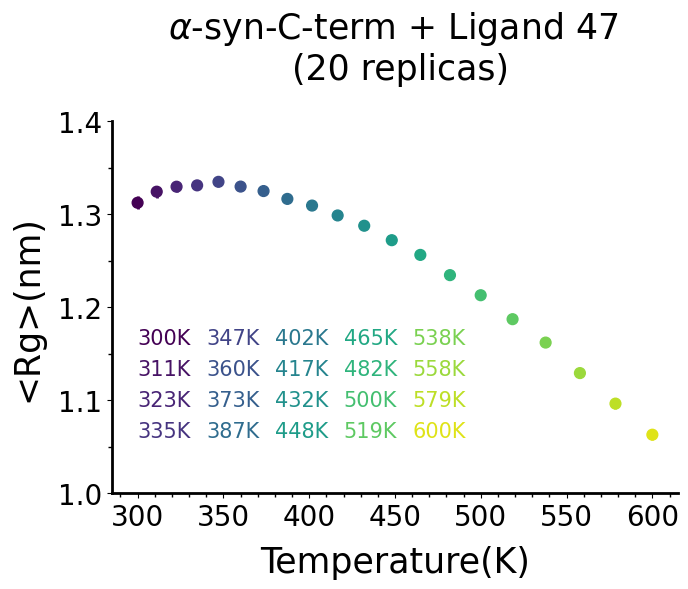

In [5]:
fig, ax = plt.subplots(figsize=(7,6))

ax.scatter(temperature[1],[get_blockerror_pyblock_nanskip(np.array(rg[f'rep:{i}']))[0] for i in range(nrep[1])], s=60, c=[plt.cm.viridis(i/nrep[1]) for i in range(nrep[1])])
ax.errorbar(temperature[1],[get_blockerror_pyblock_nanskip(np.array(rg[f'rep:{i}']))[0] for i in range(nrep[1])], elinewidth=2, 
            yerr=[get_blockerror_pyblock_nanskip(np.array(rg[f'rep:{i}']))[1] for i in range(nrep[1])], ecolor=[plt.cm.viridis(i/nrep[1]) for i in range(nrep[1])], ls='none')

ax.tick_params(labelsize=20)
ax.set_yticks(np.arange(1.0,1.5,0.1),[f"{i:2.1f}" for i in np.arange(1.0,1.5,0.1)])
ax.set_xticks(np.arange(300,650,50), np.arange(300,650,50))
ax.set_xlabel("Temperature(K)", labelpad=10, size=25)
ax.set_ylabel("<Rg>(nm)", labelpad=10, size=25)

ax.set_title(r'$\alpha$-'+f"syn-C-term + Ligand 47 \n (20 replicas)", size=25, pad=30)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(plt.MultipleLocator(50/5))
ax.tick_params(axis='x', which='minor', length=3, width=1, color='k', direction='out')
plt.gca().yaxis.set_minor_locator(plt.MultipleLocator(0.1/2))
ax.tick_params(axis='y', which='minor', length=3, width=1, color='k', direction='out')

y = 1.16
x = 300
for i in range(len(temperature[1])):
        
    ax.text(x, y, f"{round(temperature[1][i])}K", size=15, color=plt.cm.viridis(i/nrep[1]))
    y=y-0.02
    if i % 4 == 3:
        x += 40
        y = 1.16
    else:
        y -= 0.013

plt.tight_layout()


# Plot of Radius of Gyration for different demultiplexed replicas (demux)

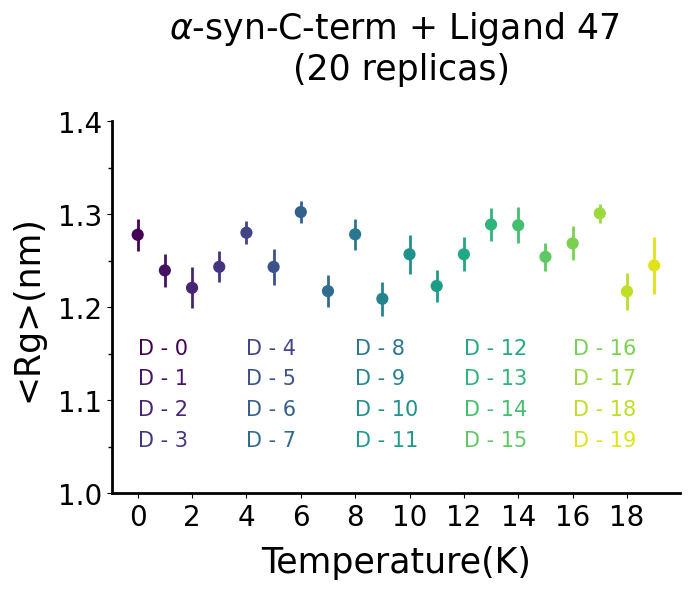

In [7]:
fig, ax = plt.subplots(figsize=(7,6))

ax.scatter(range(nrep[1]),[get_blockerror_pyblock_nanskip(np.array(rg[f'demux:{i}']))[0] for i in range(nrep[1])], s=60, c=[plt.cm.viridis(i/nrep[1]) for i in range(nrep[1])])
ax.errorbar(range(nrep[1]),[get_blockerror_pyblock_nanskip(np.array(rg[f'demux:{i}']))[0] for i in range(nrep[1])], elinewidth=2, 
            yerr=[get_blockerror_pyblock_nanskip(np.array(rg[f'demux:{i}']))[1] for i in range(nrep[1])], ecolor=[plt.cm.viridis(i/nrep[1]) for i in range(nrep[1])], ls='none')

ax.tick_params(labelsize=20)
ax.set_yticks(np.arange(1.0,1.5,0.1),[f"{i:2.1f}" for i in np.arange(1.0,1.5,0.1)])
ax.set_xticks(range(nrep[1])[::2], range(nrep[1])[::2], rotation=0)
ax.set_xlabel("Temperature(K)", labelpad=10, size=25)
ax.set_ylabel("<Rg>(nm)", labelpad=10, size=25)

ax.set_title(r'$\alpha$-'+f"syn-C-term + Ligand 47 \n (20 replicas)", size=25, pad=30)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(plt.MultipleLocator(50/5))
ax.tick_params(axis='x', which='minor', length=3, width=1, color='k', direction='out')
plt.gca().yaxis.set_minor_locator(plt.MultipleLocator(0.1/2))
ax.tick_params(axis='y', which='minor', length=3, width=1, color='k', direction='out')

y = 1.15
x = 0
for i in range(nrep[1]):
        
    ax.text(x, y, f"D - {i}", size=15, color=plt.cm.viridis(i/nrep[1]))
    y=y-0.02
    if i % 4 == 3:
        x += 4
        y = 1.15
    else:
        y -= 0.013

plt.tight_layout()


From Rg vs Replica temperature plot for 20 replicas we can clearly observe that at higher temperatures there is a collapse of protein.

We are preparing the time series for the trajectory in the below code block, which will be used for further plotting and analysis.

In [6]:
# Inputs for compute_time are a time series data and time-step of the simulation

time = compute_time(rg['rep:0'], 80)

time

array([0.00000e+00, 8.00000e-05, 1.60000e-04, ..., 1.49984e+00,
       1.49992e+00, 1.50000e+00])

Here we are checking the code for aggregate time analysis for the observables. Here we use the `time` series we computed above. `magic_num` is used to break the time series or time series data at the required time break. We will check if that break is correct or not.

In [5]:
magic_num=62.5
time_agg_dict, time_agg, _ = compute_time_batches(80,
                                                  len(rg['rep:0']),
                                                  magic_num,
                                                  check=True)


Index: 10; # of frames: 626, Time: 0.05 µs
Index: 20; # of frames: 1251, Time: 0.1 µs
Index: 30; # of frames: 1876, Time: 0.15 µs
Index: 40; # of frames: 2501, Time: 0.2 µs
Index: 50; # of frames: 3126, Time: 0.25 µs
Index: 60; # of frames: 3751, Time: 0.3 µs
Index: 70; # of frames: 4376, Time: 0.35 µs
Index: 80; # of frames: 5001, Time: 0.4 µs
Index: 90; # of frames: 5626, Time: 0.45 µs
Index: 100; # of frames: 6251, Time: 0.5 µs
Index: 110; # of frames: 6876, Time: 0.55 µs
Index: 120; # of frames: 7501, Time: 0.6 µs
Index: 130; # of frames: 8126, Time: 0.65 µs
Index: 140; # of frames: 8751, Time: 0.7 µs
Index: 150; # of frames: 9376, Time: 0.75 µs
Index: 160; # of frames: 10001, Time: 0.8 µs
Index: 170; # of frames: 10626, Time: 0.85 µs
Index: 180; # of frames: 11251, Time: 0.9 µs
Index: 190; # of frames: 11876, Time: 0.95 µs
Index: 200; # of frames: 12501, Time: 1.0 µs
Index: 210; # of frames: 13126, Time: 1.05 µs
Index: 220; # of frames: 13751, Time: 1.1 µs
Index: 230; # of frames:

# Plot of Free energy of Radius of Gyration for different aggegate times

By populating the `splits` list with required indices we can plot the respective free energies.

/data/ssREST3/Ligand47/../scripts/Block_analysis.py:102: RuntimeWarning: invalid value encountered in divide
  ferr = -(0.001987*T)*(error / average)


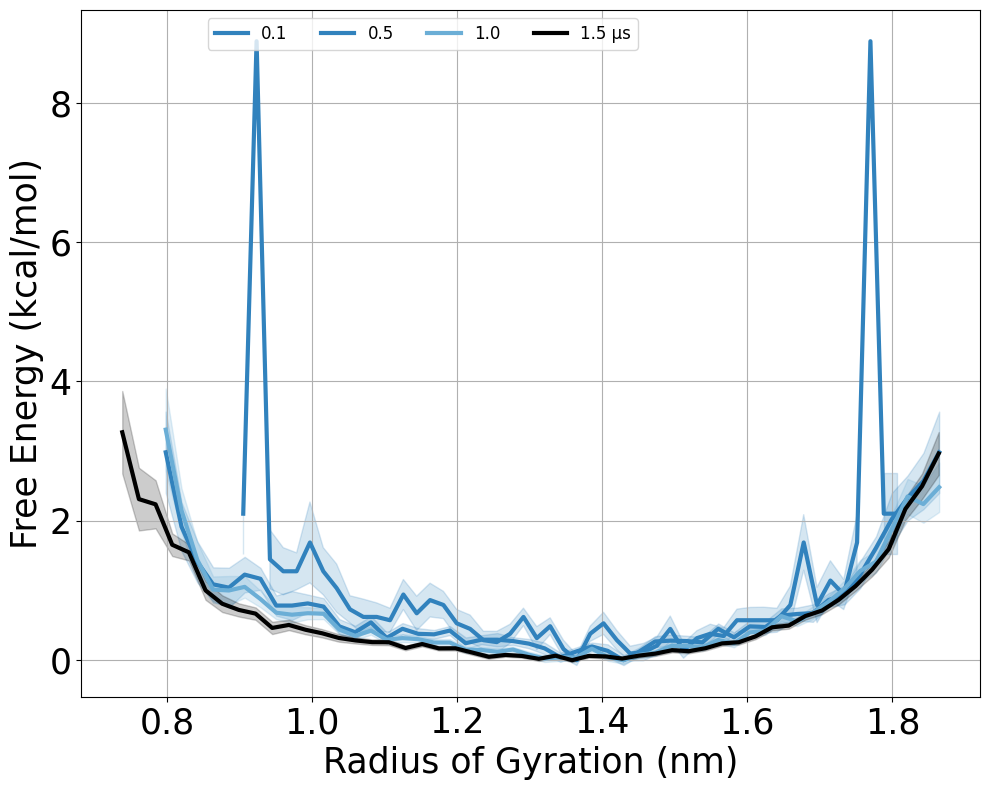

In [6]:
splits=[10, 50, 100]
magic_num=62.5

plt.figure(figsize=(10,8))

for i in splits :
        
    dG1, bin_centers, ferr = free_energy_1D_blockerror(np.array(rg['rep:0'][:int(magic_num*i)+1]), T=300, x0=min(rg['rep:0'][:int(magic_num*i)+1]), xmax=max(rg['rep:0'][:int(magic_num*i)+1]), bins=50, blocks_no=None, weights=None)
    sns.lineplot(x=bin_centers, y=dG1, color=plt.cm.tab20c(int(i/100)), linewidth=3,label=str(i/100), linestyle='-')
    plt.fill_between(bin_centers, dG1-ferr, dG1+ferr, color=plt.cm.tab20c(int(i/100)), alpha=0.2)

dG1, bin_centers, ferr = free_energy_1D_blockerror(np.array(rg['rep:0']), T=300, x0=min(rg['rep:0']), xmax=max(rg['rep:0']), bins=50, blocks_no=None, weights=None)
sns.lineplot(x=bin_centers, y=dG1, color='k', linewidth=3,label='1.5 \u03bcs', linestyle='-')
plt.fill_between(bin_centers, dG1-ferr, dG1+ferr, color='k', alpha=0.2)

# plt.ylim(-0.2, 6)
# plt.xlim(0.5, 2.25)
plt.xlabel('Radius of Gyration (nm)', size=25)
plt.ylabel('Free Energy (kcal/mol)', size=25)
plt.legend(loc='upper center', fontsize=12, ncol=5, bbox_to_anchor=(0.38, 1.0))
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
#plt.title(f"Replica : {val}", size=20)
plt.grid()
plt.tight_layout()
   

# Plot of aggregate Radius of Gyration

In [9]:
magic_num=62.5
time_split=[]
c=0
K=[]
time_agg=[]
Rg_agg=[]

for i in range(10,510,10):
    c=len(time[:int(magic_num*i)+1])
    last=time[:int(magic_num*i)+1][-1]
    time_agg.append(last)
    
    if c in time_split : break

    time_split.append(c)
    Rg_agg.append(get_blockerror_pyblock_nanskip(np.array(rg['rep:0'][:int(magic_num*i)+1])))
    
    # print(i, c, last, kd_bf_data[0])
    # print(f"Time ==> {last} microsec; Total frames ==> {c}; Rg ==> {Rg_agg[int(i/10)-1][0]:0.4f}; Rg_err ==> {Rg_agg[int(i/10)-1][1]:0.4f}")

Rg_agg=np.array(Rg_agg)
time_agg=np.array(time_agg[:-1])


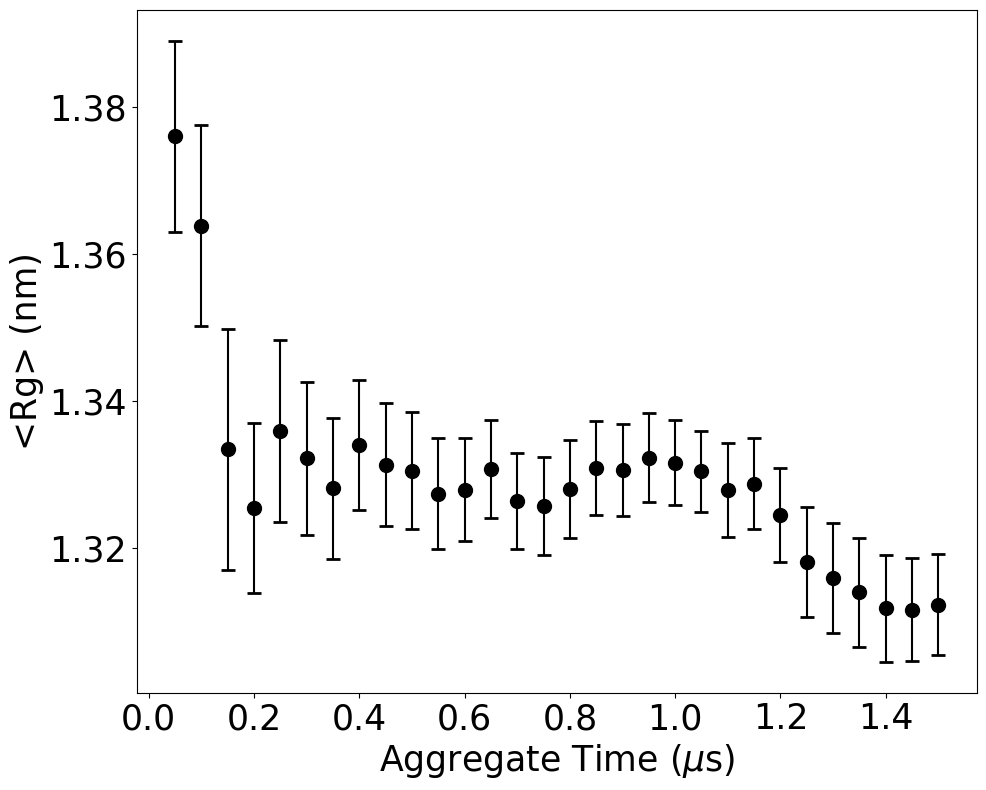

In [10]:
plt.figure(figsize=(10,8))

plt.errorbar(time_agg, Rg_agg.T[0], yerr=Rg_agg.T[1], fmt='o', color='black', markersize=10, capsize=5, capthick=2)

plt.tick_params(labelsize=25)
plt.xlabel(r'Aggregate Time ($\mu$s)', size=25)
plt.ylabel(r'<Rg> (nm)', size=25)
plt.tight_layout()


# Plot of protein bend angle w.r.t replica temperatures

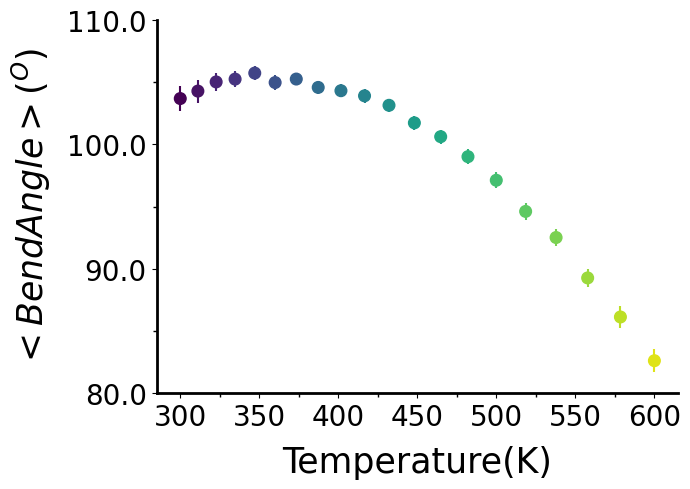

In [11]:
fig, ax = plt.subplots(figsize=(7,5))

ax.scatter(temperature[1],[ba[f'rep:{i}'][0] for i in range(nrep[1])], s=70, c=[plt.cm.viridis(i/nrep[1]) for i in range(nrep[1])])
ax.errorbar(temperature[1],[ba[f'rep:{i}'][0] for i in range(nrep[1])], yerr=[ba[f'rep:{i}'][1] for i in range(nrep[1])], ecolor=[plt.cm.viridis(i/nrep[1]) for i in range(nrep[1])], ls='none')

ax.tick_params(labelsize=20)
ax.set_yticks(np.arange(80,120,10),[f"{i:2.1f}" for i in np.arange(80,120,10)])
ax.set_xticks(np.arange(300,650,50), np.arange(300,650,50))
ax.set_xlabel("Temperature(K)", labelpad=10, size=25)
ax.set_ylabel(r"$<Bend Angle>(^{O})$", labelpad=10, size=25)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(plt.MultipleLocator(50/2))
ax.tick_params(axis='x', which='minor', length=3, width=1, color='k', direction='out')
plt.gca().yaxis.set_minor_locator(plt.MultipleLocator(10/2))
ax.tick_params(axis='y', which='minor', length=3, width=1, color='k', direction='out')

plt.tight_layout()


We can observe similar behaviour of bend angle as Radius of Gyration which shows clear collapse of protein at higher temparatures.

# Plot of helical and $\beta$-sheet content

<Figure size 1500x500 with 0 Axes>

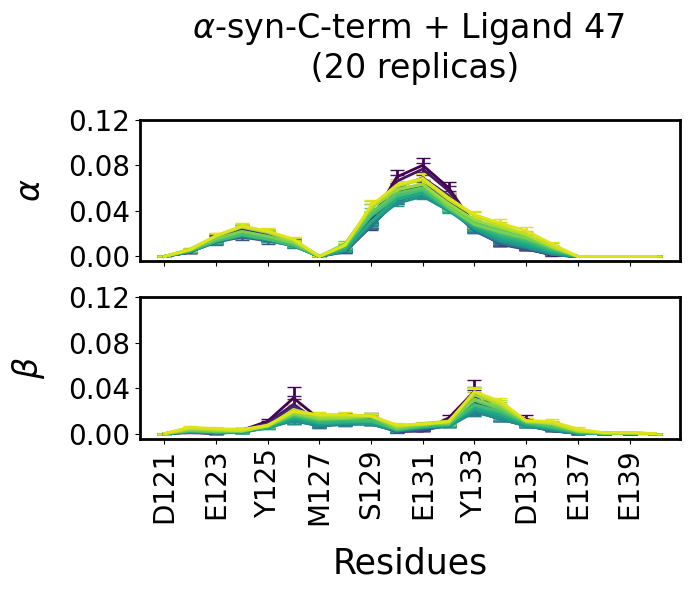

In [8]:
in_dict={int(i.split(':')[1]):helix[i] for i in helix.keys() if 'rep' in i}
in_dict_2={int(i.split(':')[1]):sheet[i] for i in sheet.keys() if 'rep' in i}

plt.figure(figsize=(15,5))

fig, axes = plt.subplots(2,1, figsize=(7,6), sharex=True, sharey=True)

for i in in_dict.keys():
        
    axes[0].errorbar(ticks_pnum, np.array(in_dict[i]).T[0], yerr=np.array(in_dict[i]).T[1], color=plt.cm.viridis(i/nrep[1]), lw=2, capsize=5)
    axes[1].errorbar(ticks_pnum, np.array(in_dict_2[i]).T[0], yerr=np.array(in_dict_2[i]).T[1], color=plt.cm.viridis(i/nrep[1]), lw=2, capsize=5)

axes[0].tick_params(labelsize=20)
axes[0].set_ylabel(r'$\alpha$', size=24,labelpad=15)

axes[1].tick_params(labelsize=20)
axes[1].set_xticks(range(0,20,2), ticks_pnum[::2],rotation=90)
axes[1].set_yticks(np.arange(0,0.14,0.04))
axes[1].set_xlabel('Residues', size=25, labelpad=15)
axes[1].set_ylabel(r'$\beta$', size=24,labelpad=15)

axes[0].set_title(r'$\alpha$-'+f"syn-C-term + Ligand 47 \n (20 replicas)", size=24, pad=30)

for ax in axes.flat:
    for spine in ax.spines.values():
        spine.set_linewidth(2)
        
# y=0.1
# x=0
# for i in range(len(temperature[1])):
        
#     axes[1].text(x, y, f"{round(temperature[1][i])}K", size=15, color=plt.cm.viridis(i/nrep[1]))
#     y=y-0.025
#     if i%2 : x = x+4 ; y=0.1

plt.tight_layout()



# Plot of helical and $\beta$-sheet content (demultiplexed trajectories)

<Figure size 1500x500 with 0 Axes>

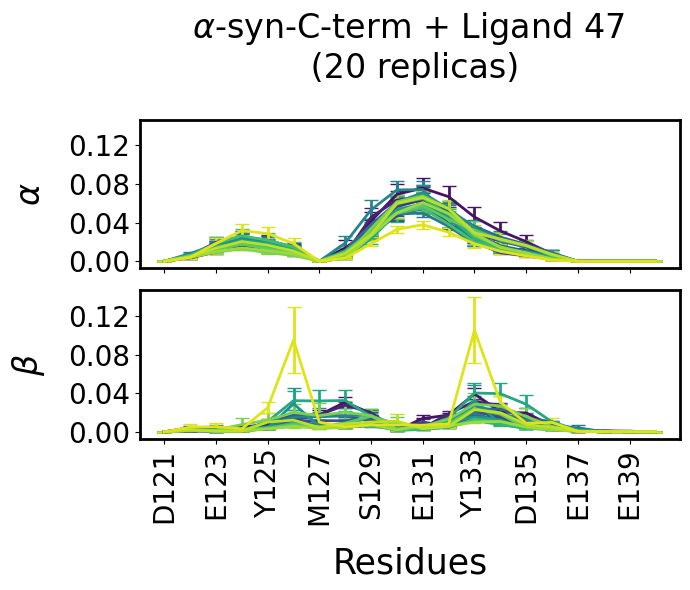

In [9]:
in_dict={int(i.split(':')[1]):helix[i] for i in helix.keys() if 'demux' in i}
in_dict_2={int(i.split(':')[1]):sheet[i] for i in sheet.keys() if 'demux' in i}

plt.figure(figsize=(15,5))

fig, axes = plt.subplots(2,1, figsize=(7,6), sharex=True, sharey=True)

for i in in_dict.keys():
        
    axes[0].errorbar(ticks_pnum, np.array(in_dict[i]).T[0], yerr=np.array(in_dict[i]).T[1], color=plt.cm.viridis(i/nrep[1]), lw=2, capsize=5)
    axes[1].errorbar(ticks_pnum, np.array(in_dict_2[i]).T[0], yerr=np.array(in_dict_2[i]).T[1], color=plt.cm.viridis(i/nrep[1]), lw=2, capsize=5)

axes[0].tick_params(labelsize=20)
axes[0].set_ylabel(r'$\alpha$', size=24,labelpad=15)

axes[1].tick_params(labelsize=20)
axes[1].set_xticks(range(0,20,2), ticks_pnum[::2],rotation=90)
axes[1].set_yticks(np.arange(0,0.14,0.04))
axes[1].set_xlabel('Residues', size=25, labelpad=15)
axes[1].set_ylabel(r'$\beta$', size=24,labelpad=15)

axes[0].set_title(r'$\alpha$-'+f"syn-C-term + Ligand 47 \n (20 replicas)", size=24, pad=30)

for ax in axes.flat:
    for spine in ax.spines.values():
        spine.set_linewidth(2)
        
# y=0.1
# x=0
# for i in range(len(temperature[1])):
        
#     axes[1].text(x, y, f"{round(temperature[1][i])}K", size=15, color=plt.cm.viridis(i/nrep[1]))
#     y=y-0.025
#     if i%2 : x = x+4 ; y=0.1

plt.tight_layout()



# Plot of dual-residue and ligand contact map

In [5]:
plot_args={'vmin': 0.0,
           'vmax': 0.4,
           'fig_size': (18,22),
        #    'cax_coor': [1, .095, .025, .874],
           'cmap': 'jet',
           'aspect' : 'auto',
           'rotation' : {'x' : 90, 'y' :0},
           'tick_size' : {'x' : 30, 'y' : 30, 'cax' :34},
           'label_size' : {'x' : 42, 'y' : 42, 'cax' :34},
           'title_size' :40,
           'dpi' : 210,
           'labels' : {'x' :"Residues", 'y':"Residues", 'x_pos' : -0.05, 'y_pos' : -0.05 },
           'nrows' : 5,
           'ncols' : 4,
           'xticks' : [" "  if i%3 else ticks_pnum[i] for i in range(len(ticks_pname)) ],
           'yticks' : [" "  if i%3 else ticks_pnum[i] for i in range(len(ticks_pname)) ],
           'tick_interval' : 1,
           'sup title':{'title' : r'$\alpha$-syn-C-term + Ligand 47 (20 replicas)',
                        'fontsize': 45, 'x': 0.5, 'y': 1.03 }}

in_dict={int(i.split(':')[1]):l_cm[i] for i in l_cm.keys() if 'rep' in i}
plot_cm_all(in_dict, 'Dual Residue \nContact Probability', show_fig=True, title_dict=[f'{round(temperature[1][i])}K' for i in range(nrep[1])], offset=1, 
             plot_args_in=plot_args)
# plt.savefig('./l_cm.png',dpi=610)

# Plot of dual-residue and ligand contact map (demultiplexed trajectories)

In [10]:
plot_args={'vmin': 0.0,
           'vmax': 0.4,
           'fig_size': (18,22),
        #    'cax_coor': [1, .095, .025, .874],
           'cmap': 'jet',
           'aspect' : 'auto',
           'rotation' : {'x' : 90, 'y' :0},
           'tick_size' : {'x' : 30, 'y' : 30, 'cax' :34},
           'label_size' : {'x' : 42, 'y' : 42, 'cax' :34},
           'title_size' :40,
           'dpi' : 210,
           'labels' : {'x' :"Residues", 'y':"Residues", 'x_pos' : -0.05, 'y_pos' : -0.05 },
           'nrows' : 5,
           'ncols' : 4,
           'xticks' : [" "  if i%3 else ticks_pnum[i] for i in range(len(ticks_pname)) ],
           'yticks' : [" "  if i%3 else ticks_pnum[i] for i in range(len(ticks_pname)) ],
           'tick_interval' : 1,
           'sup title':{'title' : r'$\alpha$-syn-C-term + Ligand 47 (20 replicas)',
                        'fontsize': 45, 'x': 0.5, 'y': 1.03 }}

in_dict={int(i.split(':')[1]):l_cm[i] for i in l_cm.keys() if 'demux' in i}
plot_cm_all(in_dict, 'Dual Residue \nContact Probability', show_fig=True, title_dict=[f'Demux - {i}' for i in range(nrep[1])], offset=1, 
             plot_args_in=plot_args)
# plt.savefig('./l_cm.png',dpi=610)

# Plot of average ligand contacts with protein residues

/tmp/ipykernel_267524/4046539700.py:33: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


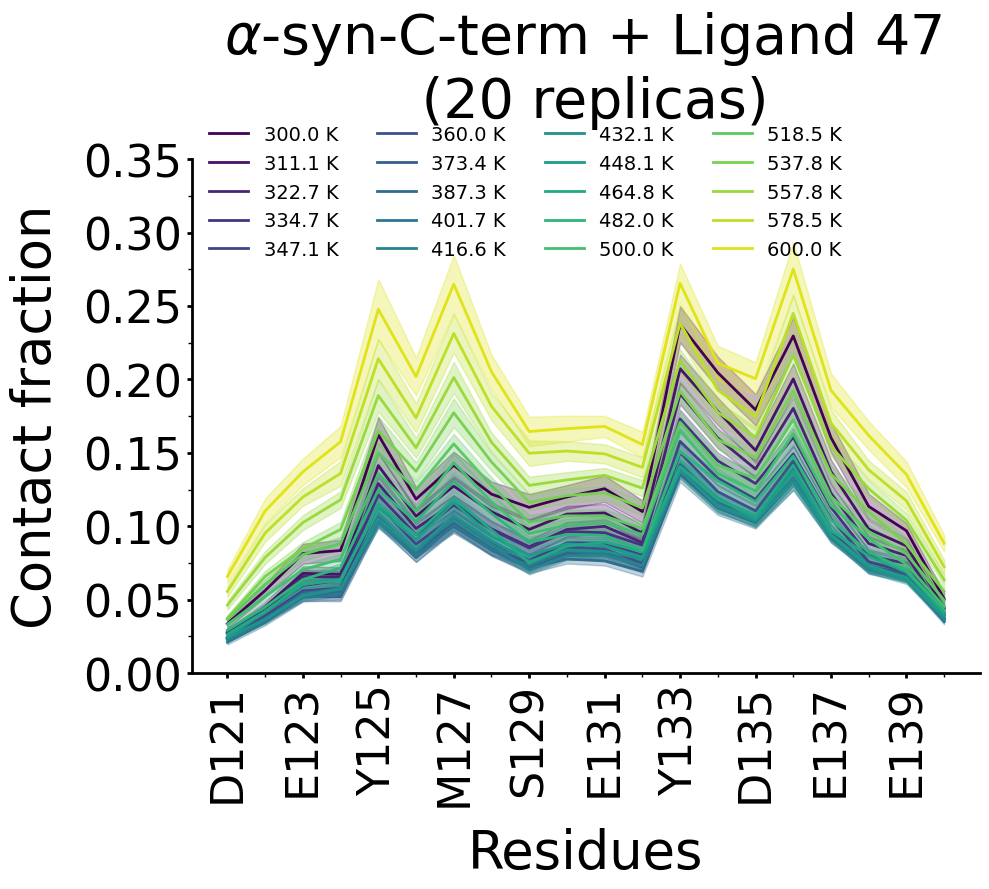

In [19]:
fig, axes = plt.subplots(1,1, figsize=(10,9), sharex=True, sharey=True, layout='constrained')

for i in range(nrep[1]):

    axes.plot(np.array(lig_contacts[f'rep:{i}']).T[0], np.array(lig_contacts[f'rep:{i}']).T[1], color=plt.cm.viridis(i/nrep[1]), lw=2, label=f'{temperature[1][i]:4.1f} K')
    axes.fill_between(np.array(lig_contacts[f'rep:{i}']).T[0], np.array(lig_contacts[f'rep:{i}']).T[1]-np.array(lig_contacts[f'rep:{i}']).T[2], np.array(lig_contacts[f'rep:{i}']).T[1]+np.array(lig_contacts[f'rep:{i}']).T[2], color=plt.cm.viridis(i/nrep[1]), alpha=0.3)

axes.tick_params(labelsize=32, width=2)
plt.rcParams["axes.linewidth"] = 2

axes.set_xticks(np.array(lig_contacts['rep:0']).T[0][::2], ticks_pnum[::2], rotation=90)
axes.set_yticks(np.arange(0, 0.4, 0.05), [f"{i:2.2f}" for i in np.arange(0, 0.4, 0.05)])

# Add minor ticks only on x-axis
plt.gca().xaxis.set_minor_locator(plt.MultipleLocator(2/2))
axes.tick_params(axis='x', which='minor', length=3, width=1, color='k', direction='out')

# Add minor ticks only on y-axis
plt.gca().yaxis.set_minor_locator(plt.MultipleLocator(0.05/2))
axes.tick_params(axis='y', which='minor', length=3, width=1, color='k', direction='out')

axes.set_xlabel('Residues', size=38, labelpad=15)
axes.set_ylabel('Contact fraction', size=38, labelpad=15)
axes.set_title(r'$\alpha$-'+f"syn-C-term + Ligand 47 \n (20 replicas)", size=40, pad=30)

axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)
axes.spines['left'].set_linewidth(2)
axes.spines['bottom'].set_linewidth(2)

axes.legend(loc='upper left', fontsize=14, ncol=4, frameon=False, bbox_to_anchor=(0, 1.1))

plt.tight_layout()


# Plot of average ligand contacts with protein residues (demultiplexed trajectories)

/tmp/ipykernel_267524/749304590.py:33: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


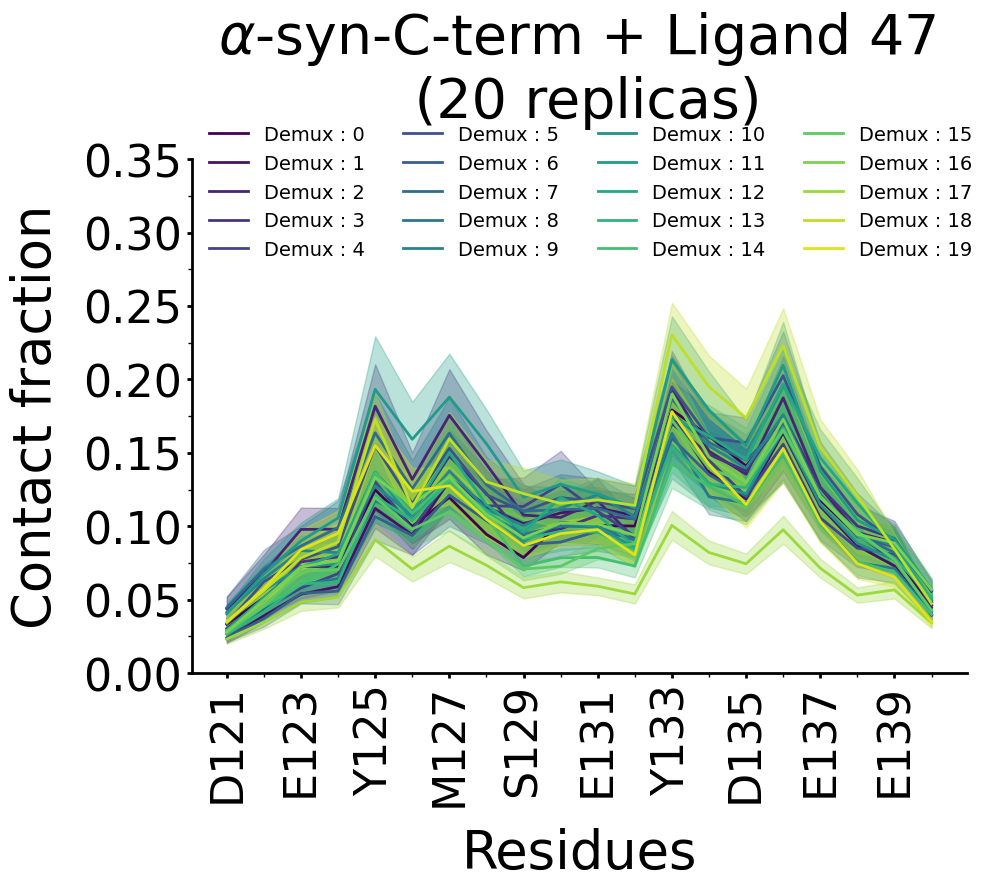

In [20]:
fig, axes = plt.subplots(1,1, figsize=(10,9), sharex=True, sharey=True, layout='constrained')

for i in range(nrep[1]):

    axes.plot(np.array(lig_contacts[f'demux:{i}']).T[0], np.array(lig_contacts[f'demux:{i}']).T[1], color=plt.cm.viridis(i/nrep[1]), lw=2, label=f'Demux : {i}')
    axes.fill_between(np.array(lig_contacts[f'demux:{i}']).T[0], np.array(lig_contacts[f'demux:{i}']).T[1]-np.array(lig_contacts[f'demux:{i}']).T[2], np.array(lig_contacts[f'demux:{i}']).T[1]+np.array(lig_contacts[f'demux:{i}']).T[2], color=plt.cm.viridis(i/nrep[1]), alpha=0.3)

axes.tick_params(labelsize=32, width=2)
plt.rcParams["axes.linewidth"] = 2

axes.set_xticks(np.array(lig_contacts['rep:0']).T[0][::2], ticks_pnum[::2], rotation=90)
axes.set_yticks(np.arange(0, 0.4, 0.05), [f"{i:2.2f}" for i in np.arange(0, 0.4, 0.05)])

# Add minor ticks only on x-axis
plt.gca().xaxis.set_minor_locator(plt.MultipleLocator(2/2))
axes.tick_params(axis='x', which='minor', length=3, width=1, color='k', direction='out')

# Add minor ticks only on y-axis
plt.gca().yaxis.set_minor_locator(plt.MultipleLocator(0.05/2))
axes.tick_params(axis='y', which='minor', length=3, width=1, color='k', direction='out')

axes.set_xlabel('Residues', size=38, labelpad=15)
axes.set_ylabel('Contact fraction', size=38, labelpad=15)
axes.set_title(r'$\alpha$-'+f"syn-C-term + Ligand 47 \n (20 replicas)", size=40, pad=30)

axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)
axes.spines['left'].set_linewidth(2)
axes.spines['bottom'].set_linewidth(2)

axes.legend(loc='upper left', fontsize=14, ncol=4, frameon=False, bbox_to_anchor=(0, 1.1))

plt.tight_layout()


# Plot of different ligand binding interactions

/tmp/ipykernel_2448445/3651394799.py:50: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


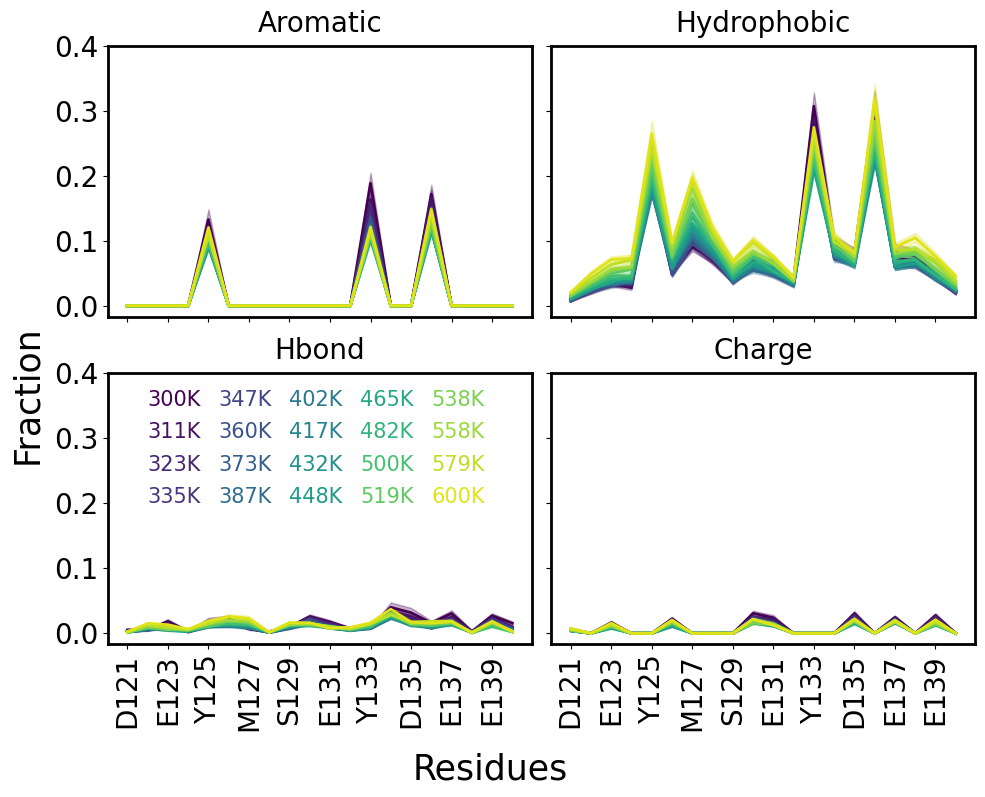

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(10,8), sharex=True, sharey=True, layout='constrained')

title_list = ['Aromatic', 'Hydrophobic', 'Hbond', 'Charge']

for i in range(nrep[1]):

    axes[0,0].tick_params(labelsize=20)
    axes[0,0].plot(np.array(aro[f'rep:{i}']).T[0], np.array(aro[f'rep:{i}']).T[1], color=plt.cm.viridis(i/nrep[1]), lw=2)
    axes[0,0].fill_between(np.array(aro[f'rep:{i}']).T[0], np.array(aro[f'rep:{i}']).T[1]-np.array(aro[f'rep:{i}']).T[2], np.array(aro[f'rep:{i}']).T[1]+np.array(aro[f'rep:{i}']).T[2], color=plt.cm.viridis(i/nrep[1]), alpha=0.3)

    axes[0,1].tick_params(labelsize=20)
    axes[0,1].plot(np.array(hyphob[f'rep:{i}']).T[0], np.array(hyphob[f'rep:{i}']).T[1], color=plt.cm.viridis(i/nrep[1]), lw=2)
    axes[0,1].fill_between(np.array(hyphob[f'rep:{i}']).T[0], np.array(hyphob[f'rep:{i}']).T[1]-np.array(hyphob[f'rep:{i}']).T[2], np.array(hyphob[f'rep:{i}']).T[1]+np.array(hyphob[f'rep:{i}']).T[2], color=plt.cm.viridis(i/nrep[1]), alpha=0.3)

    axes[1,0].tick_params(labelsize=20)
    axes[1,0].plot(np.array(hbond[f'rep:{i}']).T[0], np.array(hbond[f'rep:{i}']).T[1], color=plt.cm.viridis(i/nrep[1]), lw=2)
    axes[1,0].fill_between(np.array(hbond[f'rep:{i}']).T[0], np.array(hbond[f'rep:{i}']).T[1]-np.array(hbond[f'rep:{i}']).T[2], np.array(hbond[f'rep:{i}']).T[1]+np.array(hbond[f'rep:{i}']).T[2], color=plt.cm.viridis(i/nrep[1]), alpha=0.3)

    axes[1,1].tick_params(labelsize=20)
    axes[1,1].plot(np.array(charge[f'rep:{i}']).T[0], np.array(charge[f'rep:{i}']).T[1], color=plt.cm.viridis(i/nrep[1]), lw=2)
    axes[1,1].fill_between(np.array(charge[f'rep:{i}']).T[0], np.array(charge[f'rep:{i}']).T[1]-np.array(charge[f'rep:{i}']).T[2], np.array(charge[f'rep:{i}']).T[1]+np.array(charge[f'rep:{i}']).T[2], color=plt.cm.viridis(i/nrep[1]), alpha=0.3)


for i in title_list : 
    p,q = np.unravel_index(title_list.index(i),(2,2))
    axes[p,q].set_title(i, size=20, pad=10)

    axes[p,q].set_xticks(np.array(aro[f'rep:0']).T[0][::2], ticks_pnum[::2], rotation=90)
    axes[p,q].set_yticks(np.arange(0,0.5,0.1), [f"{i:2.1f}" for i in np.arange(0,0.5,0.1)])
fig.supxlabel('Residues', size=25)
fig.supylabel('Fraction', size=25)

y=0.35
x=122
for i in range(len(temperature[1])):
        
    axes[1,0].text(x, y, f"{round(temperature[1][i])}K", size=15, color=plt.cm.viridis(i/nrep[1]))
    y=y-0.04
    if i%4 == 3 :
        x += 3.5
        y = 0.35
    else:
        y -= 0.010
        

for ax in axes.flat:
    for spine in ax.spines.values():
        spine.set_linewidth(2)

plt.tight_layout()


# Plot of different ligand binding interactions (demultiplexed trajectories)

/tmp/ipykernel_267524/4213416516.py:50: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


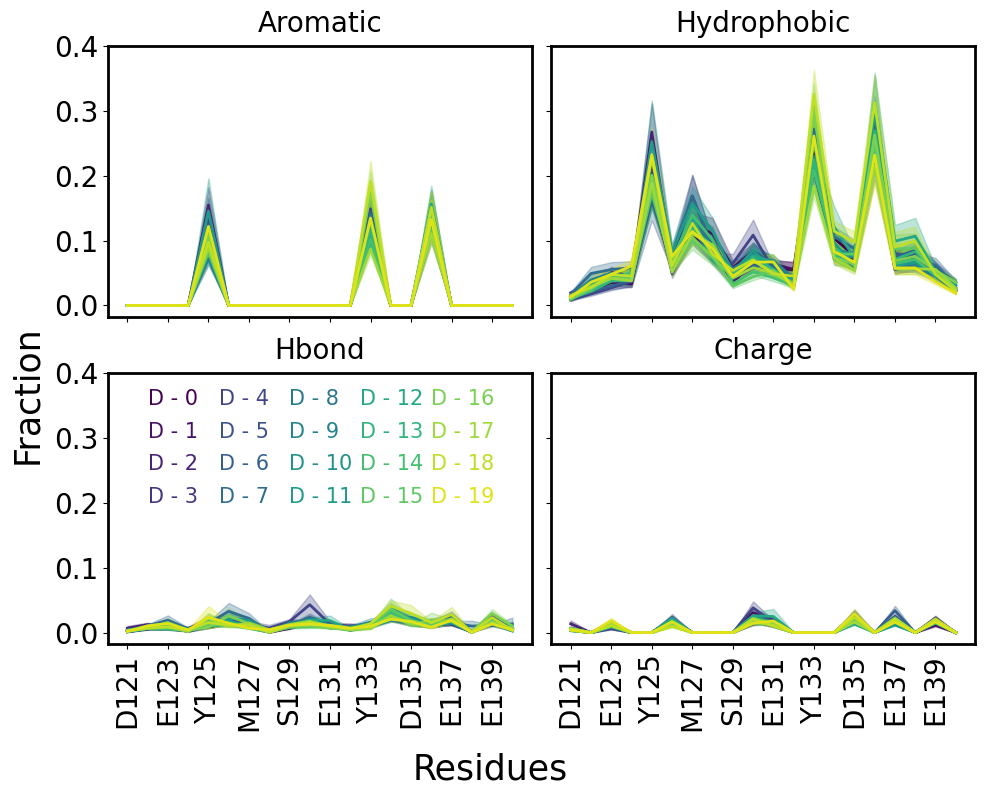

In [21]:
fig, axes = plt.subplots(2, 2, figsize=(10,8), sharex=True, sharey=True, layout='constrained')

title_list = ['Aromatic', 'Hydrophobic', 'Hbond', 'Charge']

for i in range(nrep[1]):

    axes[0,0].tick_params(labelsize=20)
    axes[0,0].plot(np.array(aro[f'demux:{i}']).T[0], np.array(aro[f'demux:{i}']).T[1], color=plt.cm.viridis(i/nrep[1]), lw=2)
    axes[0,0].fill_between(np.array(aro[f'demux:{i}']).T[0], np.array(aro[f'demux:{i}']).T[1]-np.array(aro[f'demux:{i}']).T[2], np.array(aro[f'demux:{i}']).T[1]+np.array(aro[f'demux:{i}']).T[2], color=plt.cm.viridis(i/nrep[1]), alpha=0.3)

    axes[0,1].tick_params(labelsize=20)
    axes[0,1].plot(np.array(hyphob[f'demux:{i}']).T[0], np.array(hyphob[f'demux:{i}']).T[1], color=plt.cm.viridis(i/nrep[1]), lw=2)
    axes[0,1].fill_between(np.array(hyphob[f'demux:{i}']).T[0], np.array(hyphob[f'demux:{i}']).T[1]-np.array(hyphob[f'demux:{i}']).T[2], np.array(hyphob[f'demux:{i}']).T[1]+np.array(hyphob[f'demux:{i}']).T[2], color=plt.cm.viridis(i/nrep[1]), alpha=0.3)

    axes[1,0].tick_params(labelsize=20)
    axes[1,0].plot(np.array(hbond[f'demux:{i}']).T[0], np.array(hbond[f'demux:{i}']).T[1], color=plt.cm.viridis(i/nrep[1]), lw=2)
    axes[1,0].fill_between(np.array(hbond[f'demux:{i}']).T[0], np.array(hbond[f'demux:{i}']).T[1]-np.array(hbond[f'demux:{i}']).T[2], np.array(hbond[f'demux:{i}']).T[1]+np.array(hbond[f'demux:{i}']).T[2], color=plt.cm.viridis(i/nrep[1]), alpha=0.3)

    axes[1,1].tick_params(labelsize=20)
    axes[1,1].plot(np.array(charge[f'demux:{i}']).T[0], np.array(charge[f'demux:{i}']).T[1], color=plt.cm.viridis(i/nrep[1]), lw=2)
    axes[1,1].fill_between(np.array(charge[f'demux:{i}']).T[0], np.array(charge[f'demux:{i}']).T[1]-np.array(charge[f'demux:{i}']).T[2], np.array(charge[f'demux:{i}']).T[1]+np.array(charge[f'demux:{i}']).T[2], color=plt.cm.viridis(i/nrep[1]), alpha=0.3)


for i in title_list : 
    p,q = np.unravel_index(title_list.index(i),(2,2))
    axes[p,q].set_title(i, size=20, pad=10)

    axes[p,q].set_xticks(np.array(aro[f'rep:0']).T[0][::2], ticks_pnum[::2], rotation=90)
    axes[p,q].set_yticks(np.arange(0,0.5,0.1), [f"{i:2.1f}" for i in np.arange(0,0.5,0.1)])
fig.supxlabel('Residues', size=25)
fig.supylabel('Fraction', size=25)

y=0.35
x=122
for i in range(len(temperature[1])):
        
    axes[1,0].text(x, y, f"D - {i}", size=15, color=plt.cm.viridis(i/nrep[1]))
    y=y-0.04
    if i%4 == 3 :
        x += 3.5
        y = 0.35
    else:
        y -= 0.010
        

for ax in axes.flat:
    for spine in ax.spines.values():
        spine.set_linewidth(2)

plt.tight_layout()


# Plot of fraction of bound frames (bound fraction) w.r.t replica temperatures

/tmp/ipykernel_267524/2819585209.py:30: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


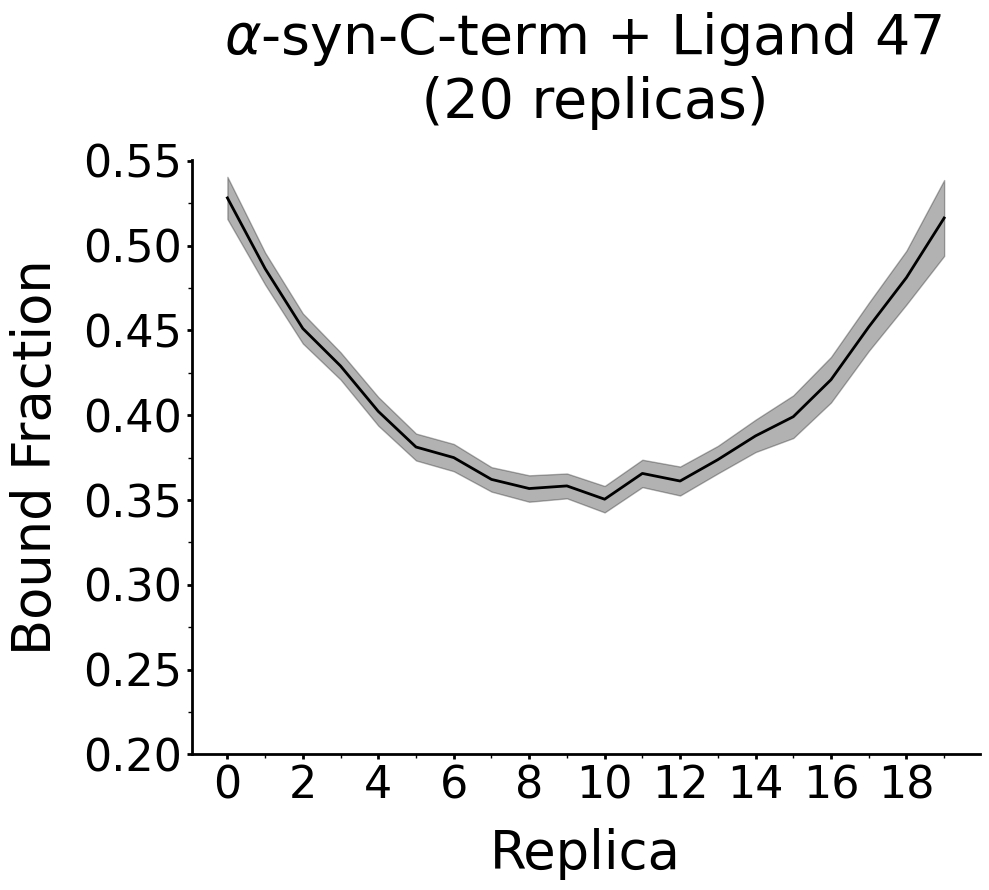

In [23]:
fig, axes = plt.subplots(1,1, figsize=(10, 9), layout="constrained")

axes.plot(range(nrep[1]), np.array([bf[f'rep:{i}'] for i in range(nrep[1])]).T[0], lw=2, color='k')
axes.fill_between(range(nrep[1]), np.array([bf[f'rep:{i}'] for i in range(nrep[1])]).T[0]-np.array([bf[f'rep:{i}'] for i in range(nrep[1])]).T[1], 
                  np.array([bf[f'rep:{i}'] for i in range(nrep[1])]).T[0]+np.array([bf[f'rep:{i}'] for i in range(nrep[1])]).T[1], alpha=0.3, color='k')

axes.tick_params(labelsize=32, width=2)
axes.set_xticks(range(nrep[1])[::2], range(nrep[1])[::2])
axes.set_yticks(np.arange(0.2,0.6,0.05), [f"{i:2.2f}" for i in np.arange(0.2,0.6,0.05)])

axes.set_xlabel('Replica', size=38, labelpad=15)
axes.set_ylabel('Bound Fraction', size=38, labelpad=15)

axes.set_title(r'$\alpha$-'+f"syn-C-term + Ligand 47 \n (20 replicas)", size=40, pad=30)

# Add minor ticks only on x-axis
plt.gca().xaxis.set_minor_locator(plt.MultipleLocator(2/2))
axes.tick_params(axis='x', which='minor', length=3, width=1, color='k', direction='out')

# Add minor ticks only on y-axis
plt.gca().yaxis.set_minor_locator(plt.MultipleLocator(0.05/2))
axes.tick_params(axis='y', which='minor', length=3, width=1, color='k', direction='out')

axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)
axes.spines['left'].set_linewidth(2)
axes.spines['bottom'].set_linewidth(2)


plt.tight_layout()

# Plot of fraction of bound frames (bound fraction) w.r.t demultiplexed trajectories

/tmp/ipykernel_267524/672896988.py:30: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


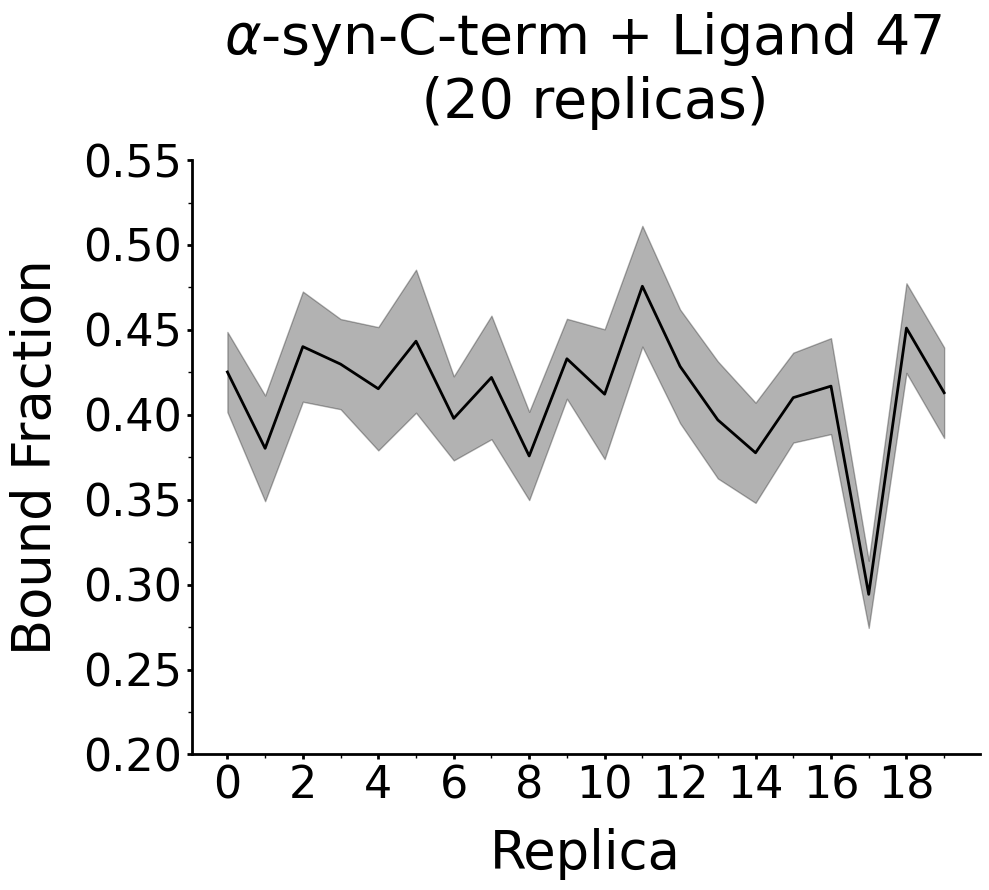

In [24]:
fig, axes = plt.subplots(1,1, figsize=(10, 9), layout="constrained")

axes.plot(range(nrep[1]), np.array([bf[f'demux:{i}'] for i in range(nrep[1])]).T[0], lw=2, color='k')
axes.fill_between(range(nrep[1]), np.array([bf[f'demux:{i}'] for i in range(nrep[1])]).T[0]-np.array([bf[f'demux:{i}'] for i in range(nrep[1])]).T[1], 
                  np.array([bf[f'demux:{i}'] for i in range(nrep[1])]).T[0]+np.array([bf[f'demux:{i}'] for i in range(nrep[1])]).T[1], alpha=0.3, color='k')

axes.tick_params(labelsize=32, width=2)
axes.set_xticks(range(nrep[1])[::2], range(nrep[1])[::2])
axes.set_yticks(np.arange(0.2,0.6,0.05), [f"{i:2.2f}" for i in np.arange(0.2,0.6,0.05)])

axes.set_xlabel('Replica', size=38, labelpad=15)
axes.set_ylabel('Bound Fraction', size=38, labelpad=15)

axes.set_title(r'$\alpha$-'+f"syn-C-term + Ligand 47 \n (20 replicas)", size=40, pad=30)

# Add minor ticks only on x-axis
plt.gca().xaxis.set_minor_locator(plt.MultipleLocator(2/2))
axes.tick_params(axis='x', which='minor', length=3, width=1, color='k', direction='out')

# Add minor ticks only on y-axis
plt.gca().yaxis.set_minor_locator(plt.MultipleLocator(0.05/2))
axes.tick_params(axis='y', which='minor', length=3, width=1, color='k', direction='out')

axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)
axes.spines['left'].set_linewidth(2)
axes.spines['bottom'].set_linewidth(2)


plt.tight_layout()

We are genrally interested in the value of bound faction of *zeroth* replica at $300K$.

In [12]:
print(f"Bound fraction of 300K replica : {np.array(bf[f'rep:{0}']).T[0]*100:2.3f} \u00B1 {np.array(bf[f'rep:{0}']).T[1]*100:2.3f} %")


Bound fraction of 300K replica : 52.813 ± 1.242 %


# Plot of aggregate time bound fraction

/tmp/ipykernel_2448445/970575169.py:21: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


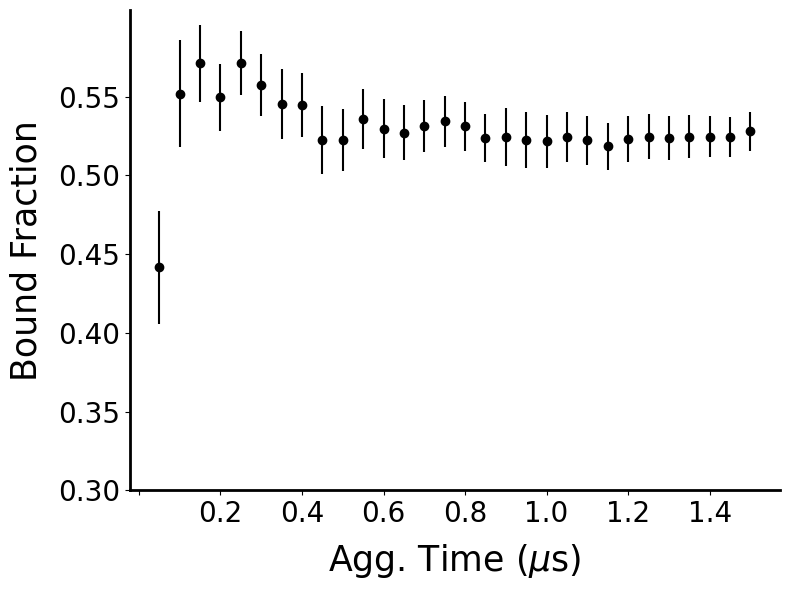

In [ ]:
fig, axes = plt.subplots(1,1, figsize=(8,6), layout="constrained")

for time, bf in ag_kd.items():


    axes.scatter(float(time)/10**3,  bf[0], color='k')
    axes.errorbar(float(time)/10**3, bf[0], yerr=bf[1], color='k', ls='none')

axes.tick_params(labelsize=20)
axes.set_xticks(np.arange(0,1.6,0.2), [" "]+[ff"{round(temperature[1][i])}K""{i:2.1f}" for i in np.arange(0.2,1.6,0.2)])
axes.set_yticks(np.arange(0.3,0.55,0.05), [f"{i:2.2f}" for i in np.arange(0.3,0.55,0.05)])

axes.set_xlabel(r'Agg. Time ($\mu$s)', size=25, labelpad=10)
axes.set_ylabel('Bound Fraction', size=25, labelpad=10)

axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)
axes.spines['left'].set_linewidth(2)
axes.spines['bottom'].set_linewidth(2)

plt.tight_layout()

# Loading data of center of mass (COM) distances between six protein segments and ligand molecule

20 amino acid $\alpha$-syuclien C-terminal is split into six segements and distances between center of mass of each segment and the ligand molecule, in this case Fasudil are computed using `plumed driver`. This analysis is performed on periodic boundary corrected trajectories of all the temperature replicas. For now, we will be loading the data for *zeroth* replica.

In [25]:
dist_300=np.loadtxt(f'{data_list_lig47[1]}/distances/colvar_0.dat', comments=['#','@']).T


# Computing and plotting the free energies for respective COM distances w.r.t aggregate time

In [27]:
dist_agg_fe={}

time_agg_dict, _ , _ = compute_time_batches(80, len(dist_300[0]), 62.5, check=False)
time = compute_time(dist_300[0], 80)

for dist_no  in range(0, 6, 1):

    magic_num=125/2
    time_split=[]
    c=0
    d=[]
    
    for i in range(10,510,10):
    
        c=len(time[:int(magic_num*i)+1])
        last=time[:int(magic_num*i)+1][-1]

        if c in time_split : break

        time_split.append(c)

        d.append(free_energy_1D_blockerror(np.array(dist_300[dist_no+1][:int(magic_num*i)+1]), T=300, x0=0.5, xmax=2.25, bins=50,))


    dist_agg_fe[dist_no]=np.array(d)

/home/jkrishna/jk_dir/TeamV/ssREST3/Ligand47/../scripts/Block_analysis.py:102: RuntimeWarning: invalid value encountered in divide
  ferr = -(0.001987*T)*(error / average)


In [20]:
dist_agg_fe[0].shape

(30, 3, 50)

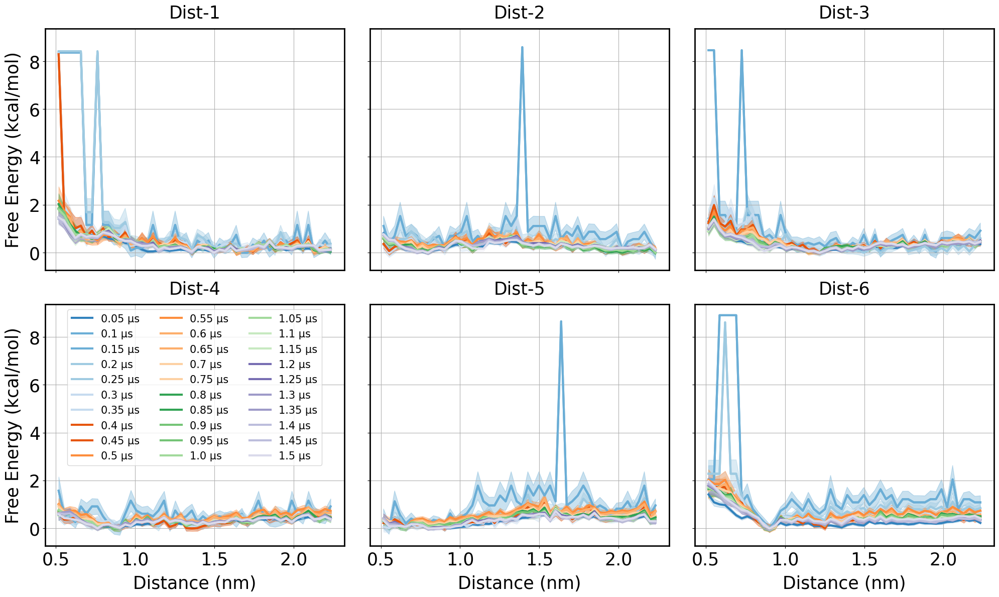

In [29]:
np.seterr(invalid='ignore')

in_list = range(50,1550, 50)

fig, ax = plt.subplots(2, 3, figsize=(20, 12), sharex=True, sharey=True)

for d in range(0,6):

    p,q = np.unravel_index(d,(2,3))

    for i in in_list:
        dG1, bin_centers, ferr = dist_agg_fe[d][int(i/100)-1][0], dist_agg_fe[d][int(i/100)-1][1], dist_agg_fe[d][int(i/100)-1][2]

        sns.lineplot(x=bin_centers, y=dG1, color=plt.cm.tab20c(int(i/100)), linewidth=3,label=f'{i/1000} \u03bcs', linestyle='-', ax=ax[p,q])
        ax[p,q].fill_between(bin_centers, dG1-ferr, dG1+ferr, color=plt.cm.tab20c(int(i/100)), alpha=0.2)

    ax[p,q].tick_params(labelsize=25)
    # ax[p,q].set_ylim(-0.2, 2)
    # ax[p,q].set_xlim(0.5, 2.25)
    ax[p,q].set_xlabel(f'Distance (nm)', size=25, labelpad=10)
    ax[p,q].set_ylabel('Free Energy (kcal/mol)', size=25, labelpad=10)
    if p==1 and q==0 : ax[p,q].legend(loc='upper center', fontsize=15, ncol=3)
    else : ax[p,q].legend().set_visible(False)
    ax[p,q].set_title(f'Dist-{d+1}', size=25, pad=15)
    ax[p,q].grid()


plt.tight_layout()

# Computing and plotting of COM distances w.r.t aggregate time

In [30]:
dist_agg={}

_, time_agg , _ = compute_time_batches(80, len(dist_300[0]), 62.5, check=False)

time = compute_time(dist_300[0], 80)

for dist_no  in range(0, 6, 1):

    magic_num=125/2
    time_split=[]
    c=0
    d=[]
    
    for i in range(10,510,10):
    
        c=len(time[:int(magic_num*i)+1])
        last=time[:int(magic_num*i)+1][-1]
        # time_agg.append(last)

        if c in time_split : break

        time_split.append(c)
        d.append(get_blockerror_pyblock_nanskip(np.array(dist_300[dist_no+1][:int(magic_num*i)+1])))
        # print(i, c, last, kd_bf_data[0])
        # print(dist_no, i, c, last)


    dist_agg[dist_no]=np.array(d)

/tmp/ipykernel_267524/251645750.py:27: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


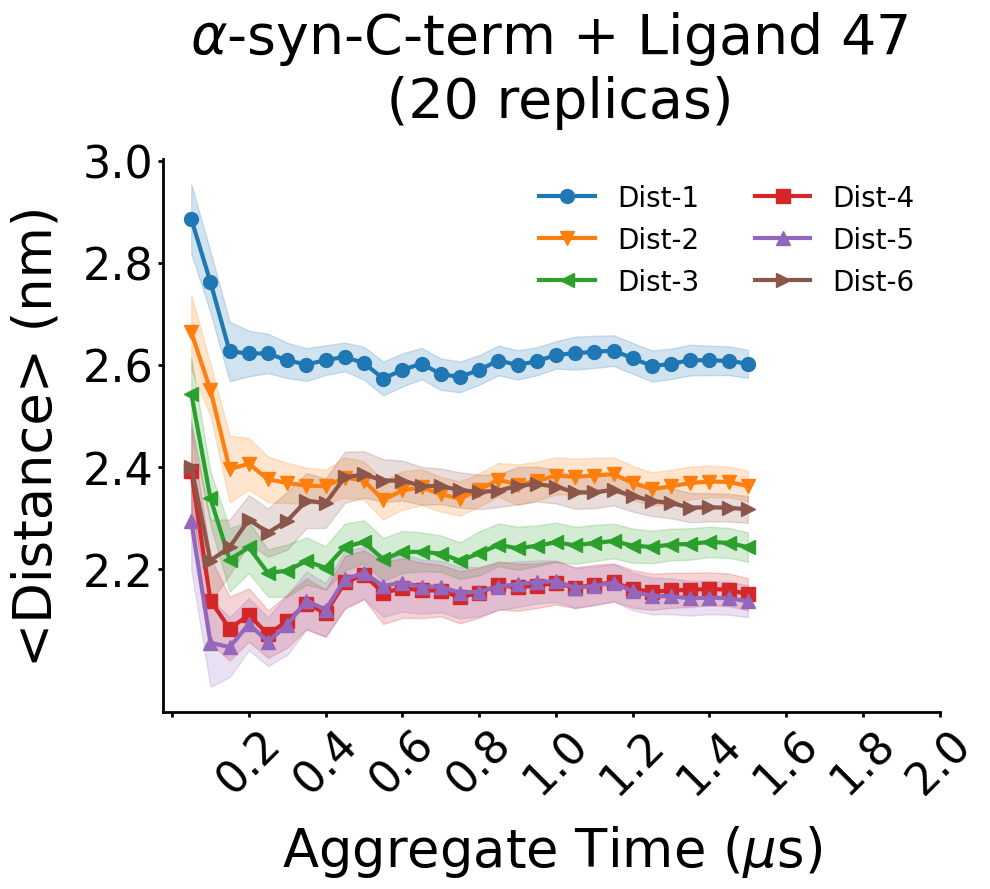

In [31]:
marker=['o','v','<', 's','^','>']

fig, ax = plt.subplots(1,1, figsize=(10,9), sharex=True, sharey=True, layout='constrained')  # Create a figure and an axes

for d in range(0,6):
    # plt.errorbar(time_agg, dist_agg[d].T[0], yerr=dist_agg[d].T[1], fmt='o', color=plt.cm.tab10(d), markersize=10, capsize=5, capthick=2, label=f'Dist-{d+1}')
    ax.plot(time_agg, dist_agg[d].T[0], color=plt.cm.tab10(d), linewidth=3, label=f'Dist-{d+1}', marker=marker[d], markersize=10)
    ax.fill_between(time_agg, dist_agg[d].T[0]-dist_agg[d].T[1], dist_agg[d].T[0]+dist_agg[d].T[1], color=plt.cm.tab10(d), alpha=0.2)

ax.tick_params(labelsize=32, width=2)
plt.rcParams["axes.linewidth"] = 2

ax.set_xticks(np.arange(0,2.2,0.2), [" "]+[f"{i:2.1f}" for i in np.arange(0.2,2.2,0.2)], rotation=45)
ax.set_yticks(np.arange(2.2, 3.2, 0.2), [f"{i:2.1f}" for i in np.arange(2.2, 3.2, 0.2)])

ax.set_xlabel(r'Aggregate Time ($\mu$s)', size=38, labelpad=15)
ax.set_ylabel(r'<Distance> (nm)', size=38, labelpad=15)
ax.legend(fontsize=20, ncol=2, frameon=False)

ax.set_title(r'$\alpha$-'+f"syn-C-term + Ligand 47 \n (20 replicas)", size=40, pad=30)

ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(2)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_linewidth(2)

plt.tight_layout()

# Loading the *zeroth* replica trajectory to compute intra-residue and dual-residue contact maps w.r.t aggregate time

In [32]:
pdb = f'{w_dir}/xtc/REST2//pbc_lig47_ions.pdb'
xtc = f'{w_dir}/xtc/REST2/lig47_20/r//pbc_0.xtc'

traj = md.load(xtc, top=pdb)
traj = traj.atom_slice(traj.topology.select('resid 0 to 20'))
traj.center_coordinates()

<mdtraj.Trajectory with 18751 frames, 338 atoms, 21 residues, and unitcells at 0x7fdfb0377c50>

In [33]:

def compute_contact_maps_parallel_chunked(traj, magic_num=156.25, timestep=80,
                                          max_workers=None, chunk_size=4, input_vals=None,
                                          protien_start_index=None, protien_end_index=None, ligand_res_index=None,
                                          cm_type='p_cm'):
    import numpy as np
    from concurrent.futures import ThreadPoolExecutor
    import multiprocessing as mp
    
    i_vals = input_vals
    max_frames = len(traj)

    end_frames = (magic_num * i_vals + 1).astype(int)
    end_frames = np.clip(end_frames, 1, max_frames)

    keep = np.concatenate(([True], np.diff(end_frames) > 0))
    i_keep = i_vals[keep]
    end_keep = end_frames[keep]

    time = compute_time(traj, timestep)
    time_agg = time[end_keep - 1]
    keys = (i_keep // 10) - 1

    jobs = list(zip(keys, end_keep))

    def worker_batch(batch):
        out = []
        for key, end_frame in batch:
            if cm_type=='p_cm' : out.append((key, contact_map_protein_rw(traj[:end_frame])))
            elif cm_type == 'l_cm' : out.append((key, contact_map_ligand_rw_2(traj[:end_frame],ps=protien_start_index, pe=protien_end_index, ligand_res_index=ligand_res_index)))
        return out

    batches = [jobs[i:i+chunk_size] for i in range(0, len(jobs), chunk_size)]

    if max_workers is None:
        max_workers = min(len(batches), mp.cpu_count())

    p_cm_agg = {}
    with ThreadPoolExecutor(max_workers=max_workers) as ex:
        for batch_result in ex.map(worker_batch, batches):
            p_cm_agg.update(batch_result)

    return p_cm_agg, time_agg, end_keep

## Computing and plotting dual-residue and ligand contact map w.r.t aggregate time

In [ ]:

l_cm_agg, time_agg, end_keep = compute_contact_maps_parallel_chunked(
    traj,
    magic_num=62.5,
    timestep=80,
    cm_type='l_cm',
    input_vals=np.arange(10, 510, 10),
    protien_start_index=0,
    protien_end_index=19,
    ligand_res_index=20
)

In [8]:
plot_args={'vmin': 0.0,
           'vmax': 0.4,
           'fig_size': (20,25),
        #    'cax_coor': [.92, .11, .03, .77],
           'cmap': 'jet',
           'aspect' : 'auto',
           'rotation' : {'x' : 90, 'y' :0},
           'tick_size' : {'x' : 28, 'y' : 28, 'cax' :30},
           'label_size' : {'x' : 38, 'y' : 38, 'cax' :36},
           'title_size' :28,
           'dpi' : 210,
           'labels' : {'x' :"Residues", 'y':"Residues" , 'x_pos' : -0.05, 'y_pos' : -0.05 },
           'nrows' : 6,
           'ncols' : 5,
           'xticks' : [" "  if i%3 else ticks_pnum[i] for i in range(len(ticks_pname)) ],
           'yticks' : [" "  if i%3 else ticks_pnum[i] for i in range(len(ticks_pname)) ],
           'tick_interval' : 1,
           'sup title':{'title' : r'$\alpha$-syn-C-term + Ligand 47 (20 replicas)',
                        'fontsize': 45, 'x': 0.5, 'y': 1.02 }}

in_dict=l_cm_agg
plot_cm_all(in_dict, 'Duel Residue \nContact Probability', show_fig=True, title_dict=[f'{i} \u03bcs' for i in time_agg], offset=1, 
             plot_args_in=plot_args)

# Plotting heat map of Radius of Gyration w.r.t Number of protein-ligand contacts ($N_{contacts}$) for each aggregate time step

Each heat map is divided into five quadrents which are shown as gray lines on the heat map. The quadrents are defined as follows:

$$
\begin{align*}
0.4 \le Rg < 0.8 \quad \& \quad  0 \le N_{contacts} \le 18 \quad \Rightarrow \quad Q_{1} \\
0.8 \le Rg \le 2.0 \quad \& \quad  0 \le N_{contacts} < 6 \quad \Rightarrow \quad Q_{2} \\
0.8 \le Rg \le 2.0 \quad \& \quad  6 \le N_{contacts} < 12 \quad \Rightarrow \quad Q_{3} \\
0.8 \le Rg \le 2.0 \quad \& \quad  12 \le N_{contacts} < 18 \quad \Rightarrow \quad Q_{4} \\
2.0 < Rg \le 2.4 \quad \& \quad  0 \le N_{contacts} \le 18 \quad \Rightarrow \quad Q_{5} \\
\end{align*}
$$

Text(0.5, 0.915, '$\\alpha$-synuclein C-term : Ligand 47')

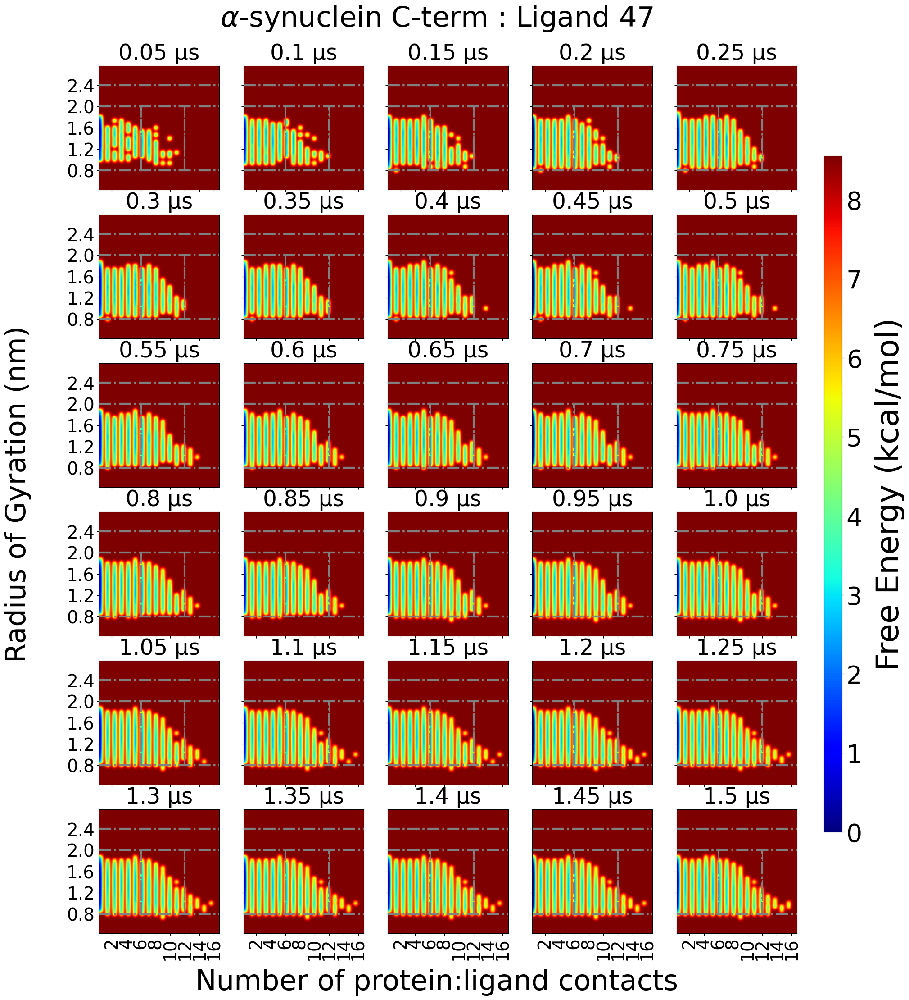

In [ ]:
histogram_data={}

time = compute_time(rg['rep:0'], 80)

magic_num=62.5
time_split=[]
c=0

fig, axes = plt.subplots(6,5, figsize=(20,25), sharex=True, sharey=True)
cax= fig.add_axes([0.93, 0.2, 0.02, 0.6])
     

images=[]
for i in range(10,510,10):
    # ax.set_axis_off()

    c=len(time[:int(magic_num*i)+1])
    last=time[:int(magic_num*i)+1][-1]
    
    if c in time_split : break

    time_split.append(c)

    # fe, xedges,yedges, histogram_data[i]  = free_energy_2D(Y=np.array(rg['rep:0'][:int(magic_num*i)+1]), X=np.sum(cm['rep:0'][:int(magic_num*i)+1], axis=1),
    #                                                        T=300,bins=35, 
    #                                                        y0=np.array(rg['rep:0'][:int(magic_num*i)+1]).min(), ymax=np.array(rg['rep:0'][:int(magic_num*i)+1]).max(), 
    #                                                        x0=np.sum(cm['rep:0'][:int(magic_num*i)+1], axis=1).min(), xmax=np.sum(cm['rep:0'][:int(magic_num*i)+1], axis=1).max())
    fe, xedges,yedges, histogram_data[i]  = free_energy_2D(Y=np.array(rg['rep:0'][:int(magic_num*i)+1]), X=np.sum(cm['rep:0'][:int(magic_num*i)+1], axis=1),
                                                           T=300,bins=35, 
                                                           y0=0.4, ymax=2.8, 
                                                           x0=0, xmax=17)
    
    p,q = np.unravel_index(int(i/10)-1,(6,5))
    im = axes[p,q].imshow(fe, cmap='jet', aspect='auto',
                          extent=[yedges[0], yedges[-1], xedges[0], xedges[-1]],
                          interpolation='gaussian')
    
    # axes[p,q].invert_yaxis()
    axes[p,q].set_xticks(np.arange(0, 17, 2), np.arange(0, 17, 2), rotation=90, size=28)
    axes[p,q].set_yticks(np.arange(0.4, 3.0, 0.4), [round(i, 1) for i in np.arange(0.4, 3.0, 0.4)], rotation=0, size=28)
    axes[p,q].grid(False)
    axes[p,q].set_title(f'{last} \u03bcs',size=35, pad=10)

    # if not q : axes[p,q].set_ylabel("Residues", size=45, labelpad=15)
    # if p == 2-1 : axes[p,q].set_xlabel('Residues', size=45, labelpad=15)
    images.append(im)

for ax in axes.flat :

    if not bool(ax.has_data()):

        fig.delaxes(ax)

for ax in axes.flat :
        
    ax.axhline(y=0.8, color='gray', lw=3, ls='-.')
    # axes.axhline(y=0.4, color='gray', lw=3, ls='-.')
    ax.axhline(y=2.0, color='gray', lw=3, ls='-.')
    ax.axhline(y=2.4, color='gray', lw=3, ls='-.')
    ax.vlines([6,12], 0.8, 2.0, color='gray', lw=2, ls='-.')

    ax.axhline(y=0.8, color='gray', lw=3, ls='-.')
    # axes.axhline(y=0.4, color='gray', lw=3, ls='-.')
    ax.axhline(y=2.0, color='gray', lw=3, ls='-.')
    ax.axhline(y=2.4, color='gray', lw=3, ls='-.')
    ax.vlines([6,12], 0.8, 2.0, color='gray', lw=3, ls='-.')

# cbar = fig.colorbar(images[-1],cax=cax, orientation="horizontal")
cbar = fig.colorbar(images[-1],cax=cax)

cbar.set_label("Free Energy (kcal/mol)", size=50, labelpad=20)
cbar.ax.tick_params(labelsize=40)
# cbar.set_ticks([])
# cbar.set_ticklabels([])

fig.text(0.5, 0.060, "Number of protein:ligand contacts", ha="center", fontsize=45)
fig.text(0.02, 0.5, "Radius of Gyration (nm)", va="center", rotation="vertical", fontsize=45)

# plt.suptitle("Protein:protien contact matix",size=50 )
fig.text(0.5, 0.915, r'$\alpha$-synuclein C-term : Ligand 47', ha="center", fontsize=45)

# plt.grid(alpha=0.1)
# plt.tight_layout()
# plt.savefig(f"{out_dir}/p_cm.png", dpi=1000, bbox_inches='tight')
# plt.savefig(f"{out_dir}/p_cm.pdf", dpi=1200, bbox_inches='tight')
# plt.savefig(f"{out_dir}/p_cm.eps", dpi=1200, bbox_inches='tight')

# Plotting the error of free energy for the heat map of Rg *vs* Number of protein-ligand contacts

Text(0.5, 0.915, '$\\alpha$-synuclein C-term : Lignad 47')

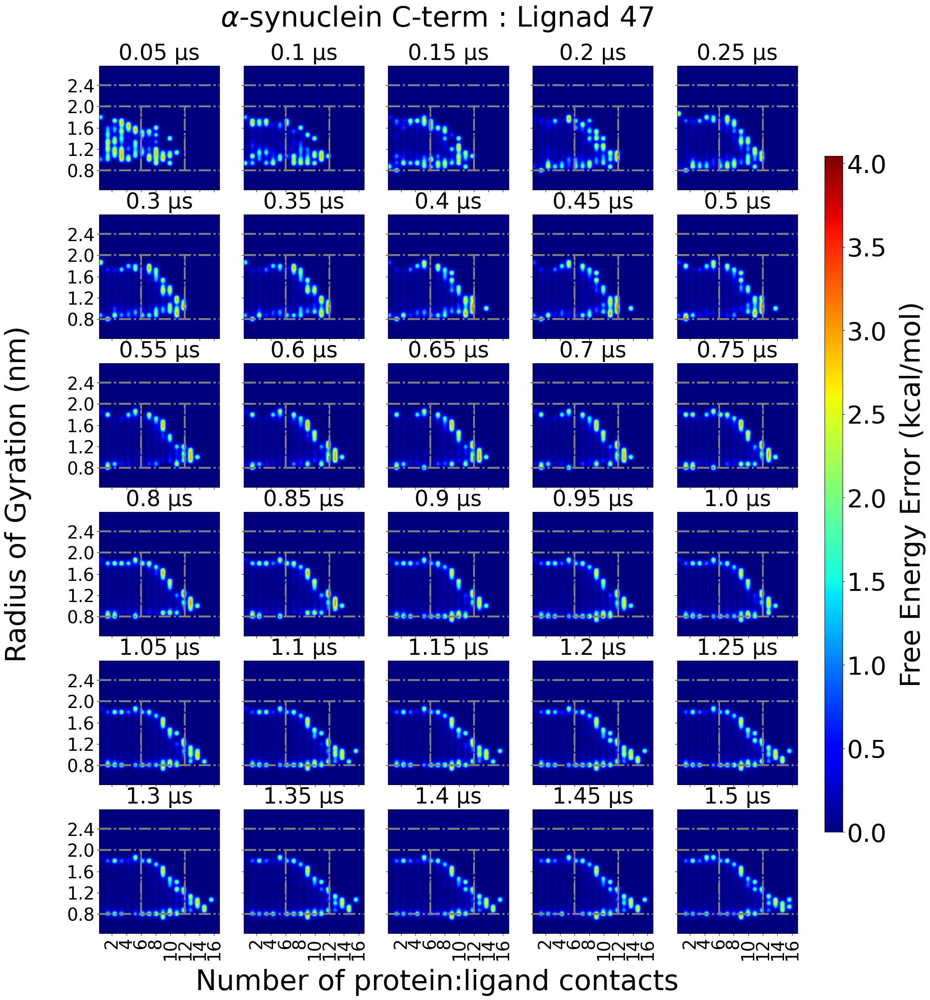

In [ ]:
mybins=35

histogram_data={}

magic_num=62.5
time_split=[]
c=0

fig, axes = plt.subplots(6,5, figsize=(20,25), sharex=True, sharey=True)
cax= fig.add_axes([0.93, 0.2, 0.02, 0.6])
     

images=[]
for i in range(10,510,10):
    # ax.set_axis_off()

    c=len(time[:int(magic_num*i)+1])
    last=time[:int(magic_num*i)+1][-1]
    
    if c in time_split : break

    time_split.append(c)

    args={'X' : np.sum(cm['rep:0'][:int(magic_num*i)+1], axis=1),
        'Y' : np.array(rg['rep:0'][:int(magic_num*i)+1]),
        'bin_count' : mybins,
        'y0' : 0.4,
        'ymax' : 2.8,
        'x0' : 0,
        'xmax' : 17}

    bootstrap_results, xcenters, ycenters = blocking_bootstrap_2d_fe(**args) 


    
    p,q = np.unravel_index(int(i/10)-1,(6,5))
    im = axes[p,q].imshow(np.flipud(bootstrap_results.standard_error.reshape(35,35)), cmap='jet', aspect='auto',
                          extent=[yedges[0], yedges[-1], xedges[0], xedges[-1]],
                          interpolation='gaussian')
    
    # axes[p,q].invert_yaxis()
    axes[p,q].set_xticks(np.arange(0, 17, 2), np.arange(0, 17, 2), rotation=90, size=28)
    axes[p,q].set_yticks(np.arange(0.4, 3.0, 0.4), [round(i, 1) for i in np.arange(0.4, 3.0, 0.4)], rotation=0, size=28)
    axes[p,q].grid(False)
    axes[p,q].set_title(f'{last} \u03bcs',size=35, pad=10)

    # if not q : axes[p,q].set_ylabel("Residues", size=45, labelpad=15)
    # if p == 2-1 : axes[p,q].set_xlabel('Residues', size=45, labelpad=15)
    images.append(im)

for ax in axes.flat :

    if not bool(ax.has_data()):

        fig.delaxes(ax)

for ax in axes.flat :
        
    ax.axhline(y=0.8, color='gray', lw=3, ls='-.')
    # axes.axhline(y=0.4, color='gray', lw=3, ls='-.')
    ax.axhline(y=2.0, color='gray', lw=3, ls='-.')
    ax.axhline(y=2.4, color='gray', lw=3, ls='-.')
    ax.vlines([6,12], 0.8, 2.0, color='gray', lw=2, ls='-.')

    ax.axhline(y=0.8, color='gray', lw=3, ls='-.')
    # axes.axhline(y=0.4, color='gray', lw=3, ls='-.')
    ax.axhline(y=2.0, color='gray', lw=3, ls='-.')
    ax.axhline(y=2.4, color='gray', lw=3, ls='-.')
    ax.vlines([6,12], 0.8, 2.0, color='gray', lw=3, ls='-.')

# cbar = fig.colorbar(images[-1],cax=cax, orientation="horizontal")
cbar = fig.colorbar(images[-1],cax=cax)

cbar.set_label("Free Energy Error (kcal/mol)", size=44, labelpad=20)
cbar.ax.tick_params(labelsize=40)
# cbar.set_ticks([])
# cbar.set_ticklabels([])

fig.text(0.5, 0.060, "Number of protein:ligand contacts", ha="center", fontsize=45)
fig.text(0.02, 0.5, "Radius of Gyration (nm)", va="center", rotation="vertical", fontsize=45)

# plt.suptitle("Protein:protien contact matix",size=50 )
fig.text(0.5, 0.915, r'$\alpha$-synuclein C-term : Ligand 47', ha="center", fontsize=45)

# plt.grid(alpha=0.1)
# plt.tight_layout()
# plt.savefig(f"{out_dir}/p_cm.png", dpi=1000, bbox_inches='tight')
# plt.savefig(f"{out_dir}/p_cm.pdf", dpi=1200, bbox_inches='tight')
# plt.savefig(f"{out_dir}/p_cm.eps", dpi=1200, bbox_inches='tight')


# Computing the percentage populations of each quardent

In [33]:
def fe_regions(x, y):
    return np.stack([
        (x >= 0.4) & (x <  0.8) & (y >= 0) & (y <= 18),
        (x >= 0.8) & (x <= 2.0) & (y >= 0) & (y < 6),
        (x >= 0.8) & (x <= 2.0) & (y >= 6) & (y < 12),
        (x >= 0.8) & (x <= 2.0) & (y >= 12) & (y <= 18),
        (x > 2.0) & (x <= 2.4) & (y >= 0) & (y <= 18)
        
    ]).astype(int)

In [34]:
quad_in=[]

magic_num=62.5
time_split=[]
c=0
la=[]

for i in range(10,510,10):
    # ax.set_axis_off()

    c=len(time[:int(magic_num*i)+1])
    last=time[:int(magic_num*i)+1][-1]
    
    if c in time_split : break

    time_split.append(c)

    la.append(last)
    Y=np.array(rg['rep:0'][:int(magic_num*i)+1])
    X=np.sum(cm['rep:0'][:int(magic_num*i)+1], axis=1)

    quad_in.append(fe_regions(x=Y, y=X))

# quad_in=np.array(quad_in, dtype=object)

In [35]:
q_bootstrap_pyblk=np.zeros((len(quad_in), len(quad_in[0]), 2)) # (9, 5, 2)

for i in range(len(quad_in)):
    for j in range(len(quad_in[i])):

                
        q_boot_mean , q_boot_er = get_blockerror_pyblock_nanskip(np.array(quad_in[i][j]))

        q_bootstrap_pyblk[i,j,0] = round(q_boot_mean * 100, 4)  # mean of the bootstrap distribution
        q_bootstrap_pyblk[i,j,1] = q_boot_er * 100   # standard error of the bootstrap distribution
        # q_bootstrap_pyblk[i,j,1] = np.std(np.array(quad_in[i][j]), ddof=1) / np.sqrt(len(np.array(quad_in[i][j])))

In [36]:
import pandas as pd

df = pd.DataFrame(q_bootstrap_pyblk[:, :, 0], columns=['Q1 %', 'Q2 %', 'Q3 %', 'Q4 %', 'Q5 %'])
df.insert(0, 'Simulation', [f"{v} \u03bcs" for v in la])

df.insert(2, 'Q1 err %', [f"{t:5.4f}" for t in q_bootstrap_pyblk.T[1][0]])
df.insert(4, 'Q2 err %', [f"{t:5.4f}" for t in q_bootstrap_pyblk.T[1][1]])
df.insert(6, 'Q3 err %', [f"{t:5.4f}" for t in q_bootstrap_pyblk.T[1][2]])
df.insert(8, 'Q4 err %', [f"{t:5.4f}" for t in q_bootstrap_pyblk.T[1][3]])
df.insert(10, 'Q5 err %', [f"{t:5.4f}" for t in q_bootstrap_pyblk.T[1][4]])


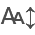

In [37]:
import itables
from itables import init_notebook_mode
init_notebook_mode(all_interactive=True)

itables.show(df, classes="display nowrap cell-border")


# Plot of probability of replicas visitng *zeroth* replica.

During demultiplexing of replica exchange trajectories, `replica_index.xvg` and `replcia_temp.xvg` files are generated. We can compute various observables using these files such as probability of replicas visitng *zeroth* replica and round trip times.

In [7]:
def zero_rep_prod(xvg_data, nreps:int=20, check:bool=True, file:str='index'):

    prob=[]
    b=0

    for i in range(nreps):

        if file == 'index' : p, p_er = get_blockerror_pyblock_nanskip(np.where(xvg_data.T[0+1]==i, 1,0))
        elif file == 'temp' : p, p_er = get_blockerror_pyblock_nanskip(np.where(xvg_data.T[i+1]==0, 1,0))

        prob.append([p*100, p_er*100])
        b=b+(p*100)

    if check : print(f'Total percentage probability: {b}')

    return np.array(prob)

One can compute probability of replicas visitng *zeroth* replica using either of the .xvg files. Let's do a sanity check.

In [8]:
# Percentage probabilities of replica visiting the base or zeroth replica
# using 'replica_index.xvg'

zero_rep_prod(xvg_index, 20, file='index')

Total percentage probability: 99.99999999999999


array([[5.64832   , 0.41535559],
       [4.14976   , 0.3637243 ],
       [4.62144   , 0.41718061],
       [4.54848   , 0.37637116],
       [6.10048   , 0.47516824],
       [4.59328   , 0.38678949],
       [5.83957333, 0.47166883],
       [3.14858667, 0.32972901],
       [4.61184   , 0.36915635],
       [4.01237333, 0.41639834],
       [4.56458667, 0.35333234],
       [4.16256   , 0.69054517],
       [5.25781333, 0.51804029],
       [5.22688   , 0.38222933],
       [4.95573333, 0.39405213],
       [5.39178667, 0.48212624],
       [6.08042667, 0.49942715],
       [4.68181333, 0.28576671],
       [4.97557333, 0.5117616 ],
       [7.42869333, 0.60621347]])

In [9]:
# Percentage probabilities of replica visiting the base or zeroth replica
# using 'replica_temp.xvg'

zero_rep_prod(xvg_temp, 20, file='temp')

Total percentage probability: 99.99999999999999


array([[5.64832   , 0.41535559],
       [4.14976   , 0.3637243 ],
       [4.62144   , 0.41718061],
       [4.54848   , 0.37637116],
       [6.10048   , 0.47516824],
       [4.59328   , 0.38678949],
       [5.83957333, 0.47166883],
       [3.14858667, 0.32972901],
       [4.61184   , 0.36915635],
       [4.01237333, 0.41639834],
       [4.56458667, 0.35333234],
       [4.16256   , 0.69054517],
       [5.25781333, 0.51804029],
       [5.22688   , 0.38222933],
       [4.95573333, 0.39405213],
       [5.39178667, 0.48212624],
       [6.08042667, 0.49942715],
       [4.68181333, 0.28576671],
       [4.97557333, 0.5117616 ],
       [7.42869333, 0.60621347]])

As we can see, precent probabilities computed from both the xvg files are same and pass the sanity check. Let's compute the round times and plot them togeather.

In [10]:
prob_zero_rep=zero_rep_prod(xvg_index, 20, file='index')


Total percentage probability: 99.99999999999999


In [11]:
# Compute Round Trip Times
def calc_round_trip_stack_2(in_data, nreps=20, dt=0.002, rep_ex=800, freq=True):
    
    n=0
    rep_dict={}
    rep=[i for i in range(nreps)]
    data=in_data[:,1:]
    min_rep=0; max_rep=nreps-1

    for i in rep:
        min_rep_flip=False ; max_rep_flip=False
        rep_dict[i] = 0
        # stack = []
        for e in data.T[i]:
            n+=1
            # if int(e) not in stack:
            #     stack.append(int(e))

            if int(e) == min_rep : min_rep_flip=True
            if int(e) == max_rep : max_rep_flip=True

            if int(e) == i and min_rep_flip and max_rep_flip :
                max_rep_flip=False
                min_rep_flip=False
                rep_dict[i]+=1
                # stack = []

        if freq : rep_dict[i] = 1/(rep_dict[i]*dt*rep_ex*10**-3)
        else : rep_dict[i] = rep_dict[i]*dt*rep_ex*10**-3   

    return rep_dict

In [12]:
rt_dict=calc_round_trip_stack_2(xvg_index, 20,freq=False)


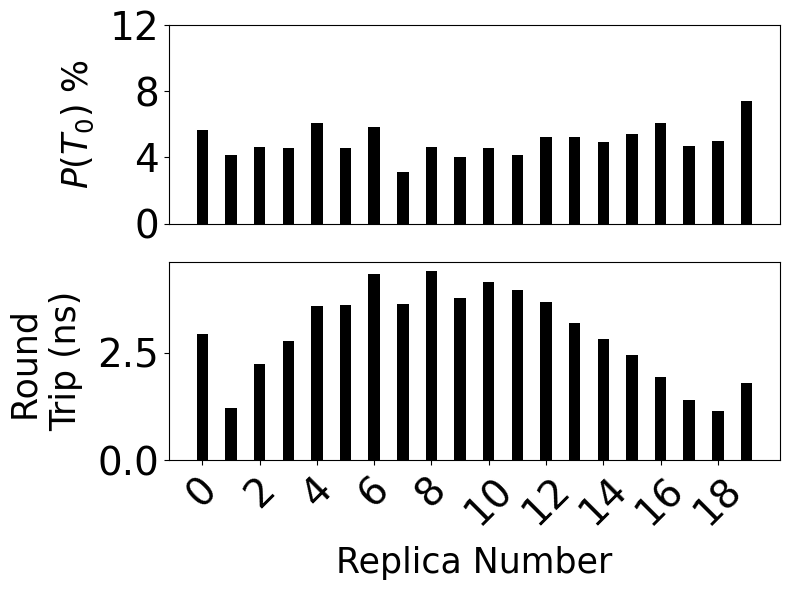

In [13]:
fig, ax = plt.subplots(2,1, figsize=(8,6), sharex=True)

ax[0].tick_params(axis='y', labelsize=28)
ax[0].bar(range(nrep[1]),prob_zero_rep.T[0],width = 0.4, color='k')
ax[0].set_yticks(np.arange(0,16,4),np.arange(0,16,4))
ax[0].set_ylabel(r'$P(T_{0})$ %', size=25, labelpad=10)


ax[0].tick_params(top=False, bottom=False,
                labeltop=False, labelbottom=False)

ax[1].tick_params(top=False, bottom=True,
                labeltop=False, labelbottom=True)
ax[1].tick_params(axis='x', labelsize=28)
ax[1].tick_params(axis='y', labelsize=28)
for keys in rt_dict.keys():
    ax[1].bar(keys,rt_dict[keys],width = 0.4, color='k')

ax[1].set_xticks(range(nrep[1])[::2],range(nrep[1])[::2], rotation=45)
# ax[1].set_yticks(range(0,1500,500),range(0,1500,500))
ax[1].set_ylabel(f"Round \nTrip (ns)", size=25, labelpad=10)
ax[1].set_xlabel('Replica Number', size=25, labelpad=10)

plt.tight_layout()